# Explication du projet

Le site de vente en ligne brésilien Olist souhaite segmenter ses clients en fonction de leur profil afin de mieux clibler leurs campagnes de communication. Cette segmentation vise donc à mieux comprendre les comportements d'achat et les caractéristiques des clients pour proposer des actions marketing plus cibléses, personnalisées et efficaces. 

Ce notebook est consacré à la phase de segmentation client. Il s'appuie sur la table client construite lors du premier notebook qui regroupe des indicateurs agrégés sur les clients de la plateforme d'Olist. Plusieurs approches de segmentation seront explorées et testées allant des méthodes les plus simples au plus complexes. La pertinence de chacune des segmentations pour le cas d'usage d'Olist sera évaluée. Cette évaluation se basera sur différents critères : qualité des groupes obtenus, stabilité à l'initialisation et exploitabilité.

L’objectif est d’identifier le modèle de segmentation le plus adapté au context d'Olist, c’est-à-dire celui qui offre le meilleur compromis entre : la qualité des segments obtenus d'un point de vue statistique (groupes homogènes et bien séparés) et leur utilisation concrète par les équipes marketing d’Olist (simplicité, stabilité, explicabilité).

# Sommaire
- [1 Explication du projet](#Explication-du-projet)
- [2 Sommaire](#Sommaire)
- [3 Import](#Import-des-bibliothèques-et-des-données)
- [4 Etapes préliminaires](#Etapes-préliminaires)
- [5 Fonctions pour la visualisation des résultats](#Fonctions-pour-la-visualisation-des-résultats)
- [6 Présentation générale des différentes méthodes utilisées](#Présentation-générale-des-différentes-méthodes)
- [7 Première segmentation: KMeans on RFM](#Première-segmentation:-KMeans-on-RFM)
- [8 Deuxième segmentation: KMeans on RFMA](#Deuxième-segmentation:-KMeans-on-RFM-+-avis-clients)
- [9 Troisième segmentation: KMeans on RFMADC](#Troisième-segmentation:-KMeans-on-RFMA-+-délais-livraison-+-nombre-de-commande-annulée)
- [10 Quatrième segmentation: KMeans on RFMADC + autres variables](#Quatrième-segmentation:-KMeans-on-RFMADC-+-autres-variables-numériques)
- [11 Cinquième segmentation: KMédoïd on RFMADC + cat var](#Cinquième-segmentation:-KMédoïd-on-RFMADC-(+-cat-var))
- [12 Sixième segmentation: DBSCAN on RFMADC](#Sixième-segmentation:-DBSCAN-on-RFMADC)
- [13 Septième segmentation: AgglomérativeClustering on RFMADC](#Septième-segmentation:-AgglomerativeClustering-on-RFMADC)
- [14 Choix de la segmentation et analyse SHAP](#Choix-de-la-segmentation-et-analyse-SHAP)
- [15 Conclusions](#Conclusions)


# Import des bibliothèques et des données

**Import des librairies**

In [1]:
# Manipulation de données
import pandas as pd
import numpy as np

# Gestion des warnings
import warnings

# Représentation graphique
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px

# Pretraitement évaluation et clustering
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, PowerTransformer, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, fcluster, linkage
from sklearn_extra.cluster import KMedoids
import gower
from sklearn.metrics import silhouette_score, adjusted_rand_score, calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score, silhouette_samples
from yellowbrick.cluster import KElbowVisualizer
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestClassifier
from umap import UMAP
import shap

**Import des données**

In [2]:
# import du jeu de données obtenu lors du notebook d'exploration et de nettoyage
Data = pd.read_csv("../Output/Table/Customer_final.csv", index_col=0)

In [3]:
# Visualisation des 5 premières lignes
Data.head(5)

,is_seller,favorite_order_weekday,favorite_order_month,mean_review,n_days_since_last_order,mean_n_items_by_order,n_orders_total,montant_total,n_items_tot,have_reviewed,mean_shipping_price_prop_by_order,mean_shipping_price_by_order,n_days_delivery_delayed_by_order,n_days_btwn_pymt_and_est_delivery_by_order,n_canceled_order,tenure
customer_unique_id,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0,3,5,5.0,160,1.0,1,141.90,1.0,1,0.084567,12.00,0.0,10.0,0,160
0000b849f77a49e4a4ce2b2a4ca5be3f,0,0,5,4.0,163,1.0,1,27.19,1.0,1,0.304892,8.29,0.0,7.0,0,163
0000f46a3911fa3c0805444483337064,0,4,3,3.0,585,1.0,1,86.22,1.0,1,0.199722,17.22,0.0,27.0,0,585
0000f6ccb0745a6a4b88665a16c9f078,0,3,10,4.0,369,1.0,1,43.62,1.0,1,0.404172,17.63,0.0,31.0,0,369
0004aac84e0df4da2b147fca70cf8255,0,1,11,5.0,336,1.0,1,196.89,1.0,1,0.085784,16.89,0.0,20.0,0,336


#  Etapes préliminaires

In [4]:
# Affichage des graphiques plotly dans le notebook
pio.renderers.default = 'notebook'

In [5]:
# Définition d'un random state pour les étapes incluant de l'aléatoire
rdm_stt = 0

In [6]:
# Formatage des variables catégorielles
Data['favorite_order_weekday'] = Data['favorite_order_weekday'].astype('int')
Data['favorite_order_month'] = Data['favorite_order_month'].astype('int')
Data['have_reviewed'] = Data['have_reviewed'].astype('int')

# Fonctions pour la visualisation des résultats

Lors de l'exploration des différentes segmentaitons, un certains nombre de représentations graphiques seront construites pour analyser les distributions des différents indicateurs, évaluer la qualité de la segmentation et interpréter les différents segments. Pour faciliter la lisibilité des différentes analyses, plusieurs fonctions seront créées pour générer ces différentes représentations graphiques. Les objectifs de chacune des fonctions qui seront définies sont les suivants:

- Fonction n°1 : Génère les graphiques illustrant la distribution des variables utilisées pour la segmentation, avant et après normalisation
- Fonction n°2a : Produit des graphiques d’aide à la décision pour déterminer le nombre optimal de clusters à utiliser dans la méthode K-Means en utilisant différents score d'évaluation (Distorsion, silhouette, Calinski-Harabasz)
- Fonction n°2b : Produit un graphique d’aide à la décision pour déterminer le nombre optimal de clusters à utiliser dans la méthode K-Means en utilisant l'indice Davies-Bouldin
- Fonction n°3 : Produit un graphique représentant les scores de silhouette individuels de la segmentation retenue
- Fonction n°4 : Représente la distribution des scores d’ARI obtenus à partir de plusieurs exécutions de la segmentation, permettant d’évaluer la stabilité des résultats.
- Fonction n°5 : Représente les effectifs des observations dans chaque cluster à l’aide d’un graphique en barres.
- Fonction n°6 : Représente la distribution des variables numériques au sein de chaque cluster, sous forme de boxplots
- Fonction n°7 : Génère un radar plot présentant les moyennes des différents indicateurs pour chaque cluster
- Fonction n°8 : Produit un scatter plot bivarié pour visualiser la distribution conjointe de deux indicateurs, avec une coloration selon les clusters.

In [7]:
def facet_violin_plot(data, data_norm, var):
    
    """
    Affiche des violin plot en facettes pour une variable avant et après normalisation.

    Paramètres:
        data (pandas.DataFrame): DataFrame contenant les données à tracer avant normalisation.
        data_norm (pandas.DataFrame): DataFrame contenant les données à tracer après normalisation.
        var (list of str): Liste des noms de colonnes correspondant aux variables numériques à visualiser.

    Retour:
        None. Affiche une figure avec un violinplot avant et après normalisation.

    Notes:
        - Les données sont formatées pour être affichées dans un FacetGrid.
    """

    # Copie des dataframes
    Df_data = data.copy()
    Df_norm = data_norm.copy()

    # Ajout d'une variable indiquant si les données sont normalisées ou non
    Df_data['Normalisation'] = 'Avant'
    Df_norm['Normalisation'] = 'Après'

    # Regroupement des deux dataframes
    Df_graph = pd.concat([Df_data, Df_norm])

    # Construction des histogrammes
    g = sns.FacetGrid(Df_graph, col="Normalisation", col_wrap=2, sharex=False, sharey=False, height=3, aspect=2)
    g.map_dataframe(sns.violinplot, x=var)

    # Ajout de la moyenne avant et après normalisation
    for ax, (name, subdata) in zip(g.axes.flat, Df_graph.groupby("Normalisation", sort=False)):
        mean_values = subdata[var].mean()
        ax.axvline(mean_values, color="red", linestyle="--", linewidth=1)
        ax.legend([f"Moyenne ({name}) = {mean_values:.2f}"], loc='upper right', fontsize=8)

    # Ajustement du graphique
    plt.tight_layout()
    
    # Sauvegarde de la figure
    plt.savefig(f'../Output/Normalisation/Distribution de la variable {var} avant et après normalisation', format='png')

    # Affichage du graphique
    plt.show()

In [8]:
def Graph_elbow(df, scoring_list, clust, preprocessor, save_name, ponderator=None):
    
    """
    Trace la courbe d'évolution de différentes métriques de scoring afin d'aider à déterminer
    le nombre optimal de clusters.
    Pour chaque métrique dans scoring_list, la fonction :
    - applique un pipeline incluant un prétraitement, une éventuelle pondération et le modèle de segmentation
    - utilise `KElbowVisualizer` pour visualiser la métrique en fonction du nombre de clusters (k)
    - affiche les graphiques dans une grille côte à côte.

    Paramètres:
        data (pandas.DataFrame): Données à segmenter
        scoring_list (list of str): Liste des noms de métriques à utiliser par KElbowVisualizer
        clust (estimator): Estimateur de segmentation compatible avec KElbowVisualizer
        preprocessor (Transformer):  ColumnTransformer pour prétraiter les données
        save_name (str): Nom de sauvegarde des graphiques
        ponderator (Transformer, optionnel): Transformer optionnel pour appliquer une pondération

    Retour:
        None. Affiche les courbes de scoring.
    """
    
    # Construction de la figure
    fig, axes = plt.subplots(1, len(scoring_list), figsize=(18, 5))

    # Pour chaque score de la liste scoring_list
    for i, s in enumerate(scoring_list):

        # Construction du graphique correspondant au score i
        visualizer = KElbowVisualizer(
            clust,
            k=(2, 10),
            metric=s,
            ax=axes[i],
            locate_elbow=True
        )

        # Définition de la pipeline à appliquer
        pipeline = Pipeline([
            ("preprocessor", preprocessor),
            ("ponderator", ponderator),
            ("visualizer", visualizer)
        ])

        # Enrtrainement de la pipeline
        pipeline.fit(df)

        # Ajout des titres et labels
        axes[i].set_title(f"Évaluation des clusters selon le score '{s}'")
        axes[i].set_xlabel("Nombre de clusters (k)")

    # Ajustement du graphique
    plt.tight_layout()
    
    # Sauvegarde du graphique
    plt.savefig(f'../Output/Performances/{save_name}.png', format='png')

    # Affichage du graphique
    plt.show()


In [9]:
def Davies_Bouldin_score(df, preprocessor, save_name):
    
    """
    Calcule et affiche l'évolution de l'indice de Davies-Bouldin pour différents nombres de clusters.

    Cette fonction normalise les données, applique un algorithme de clustering
    pour différents nombres de clusters (k de 2 à 10), calcule l'indice de Davies-Bouldin
    pour chaque partition, puis trace ce score en fonction de k pour aider à choisir
    le nombre optimal de clusters.

    Paramètres:
        df (pandas.DataFrame): DataFrame contenant les données à clusteriser
        clust (estimator): Estimateur de segmentation non encore entraîné
        preprocessor (transformer): Transformer pour normaliser ou transformer les données
        save_name (str): Nom de sauvegarde des graphiques

    Retour:
        None. Affiche un graphique représentant l'indice de Davies-Bouldin
        en fonction du nombre de clusters.
    """

    # Copie de la dataframe
    Data_graph = df.copy()

    # Normalisation des données
    Data_graph_norm = preprocessor.fit_transform(Data_graph)

    # Initialisation des résultats
    db_scores = []

    # Boucle sur le nombre de cluster
    for k in range(2, 11):

        # Définition du modèle
        clust = KMeans(n_clusters=k, random_state=rdm_stt)

        # Prédiction des étiquettes de chaque cluster
        labels = clust.fit_predict(Data_graph_norm)

        # Calcule du score de Davies-Bouldin
        db_index = davies_bouldin_score(Data_graph_norm, labels)

        # Ajout du score dans la liste de résultat
        db_scores.append(db_index)

    # Construction du graphique
    plt.figure(figsize=(4, 3))
    plt.plot(range(2, 11), db_scores, marker='o')
    plt.xlabel("Nombre de clusters (k)")
    plt.ylabel("Indice de Davies-Bouldin")
    plt.title("Évaluation des clusters selon le score Davies-Bouldin")
    
    # Sauvegarde du graphique
    plt.savefig(f'../Output/Performances/{save_name}.png', format='png')

    # Affichage du graphique
    plt.show()

In [10]:
def graph_silhouette_score(df, preprocessor, clust, n_clusters, save_name):
    
    """
    Affiche un graphique des scores de silhouette individuels pour une segmentation en k clusters.

    Cette fonction normalise les données, applique un algorithme de clustering,
    calcule les scores de silhouette pour chaque observation, puis affiche un graphique
    représentant la distribution des scores par cluster.

    Paramètres:
        df (pandas.DataFrame): Données d'entrée non normalisées à clusteriser.
        preprocessor (transformer): Transformer pour normaliser ou transformer les données.
        clust (estimator): Estimateur de segmentation non entrainé
        n_clusters (int): Nombre de clusters (k) utilisé pour la segmentation et le tracé.
        save_name (str): Nom de sauvegarde des graphiques

    Retour:
        None. Affiche un graphique des scores de silhouette.
    """
    # Copie de la dataframe
    Df_graph = df.copy()

    # Normalisation des données
    Df_graph_norm = preprocessor.fit_transform(Df_graph)

    # Prédiction des clusters
    labels = clust.fit_predict(Df_graph_norm)

    # Calcul des scores de silhouettes pour chaque observation
    silhouette_vals = silhouette_samples(Df_graph_norm, labels)

    # Affichage du score de silhouette moyen
    print(f'Score de silhouette moyen : {silhouette_vals.mean()}')

    # Définition de la hauteur avant le début du premier cluster
    y_lower = 10

    # Construction de la figure
    plt.figure(figsize=(8, 6))

    # Pour chaque cluster
    for i in range(n_clusters):

        # Extraction des scores de silhouettes du cluster i
        cluster_silhouette_vals = silhouette_vals[labels == i]

        # Tri des score de silhouette
        cluster_silhouette_vals.sort()

        # Calcul de l'effectif de chaque cluster
        taille_cluster = cluster_silhouette_vals.shape[0]

        # Calcul de la hauteur des clusters sur le graphique
        y_upper = y_lower + taille_cluster

        # Construction de la liste de couleur à utiliser
        color = cm.viridis(float(i) / (n_clusters - 1))
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, cluster_silhouette_vals,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Etiquette du cluster à côté de la barre
        plt.text(-0.05, y_lower + 0.5 * taille_cluster, str(i))

        # Calcul de la position du début du prochain cluster
        y_lower = y_upper + 10

    # Mise en page du graphique
    plt.title(f"Silhouette plot pour k = {n_clusters}")
    plt.xlabel("Score silhouette")
    plt.ylabel("Observations")

    # Ajout du score de silhouette moyen
    plt.axvline(x=np.mean(silhouette_vals), color="red", linestyle="--")
    plt.yticks([])
    
    # Sauvegarde du graphique
    plt.savefig(f'../Output/Performances/{save_name}.png', format='png')

    # Affichage du graphique
    plt.show()

In [11]:
def stabilite_initiation(df, clust, preprocessor, n_initiation, labels, score, score_name, save_name, ponderator=None):
    
    """
    Évalue la stabilité d’un algorithme de clustering sur plusieurs initialisations.

    Pour chaque itération d'initialisation, la fonction :
    - applique une pipeline incluant un prétraitement, une pondération optionnelle, et le modèle de segmentation
    - calcule un score de qualité du clustering comparant les labels prédits aux labels réels

    Paramètres:
        df (pandas.DataFrame): Données d’entrée non normalisées à segmenter.
        clust (estimator): Estimateur de segmentation non entrainé
        preprocessor (Transformer): Transformer pour normaliser ou transformer les données.
        n_initiation (int): Nombre d’initialisations pour tester la stabilité.
        labels (array-like): Labels de référence pour la comparaison.
        score (callable): Fonction d’évaluation prenant en entrée labels de référence, labels_prédits et retournant un score.
        score_name (str): Nom de la métrique de score, utilisé pour le titre du graphique.
        save_name (str): Nom de sauvegarde des graphiques
        ponderator (Transformer, optionnel): Transformer optionnel pour appliquer une pondération sur les données.

    Retour:
        None. Affiche un boxplot montrant la distribution des scores sur les différentes initialisations.
    """

    # Nom de l'agorithme
    clust_name = clust.__class__.__name__
    
    # Initalisation de la liste résultat
    resultat = []

    # Pour chaque segmentation
    for i in range(n_initiation):

        # Définition de la pipeline à appliquer
        pipeline_clust = Pipeline([
            ("preprocessor", preprocessor),
            ("ponderator", ponderator),
            ("clustering", clust)])

        # Prédiction des nouvelles étiquettes de cluster
        new_label = pipeline_clust.fit_predict(df)

        # Calcul du score
        score_calc = score(labels, new_label)

        # Création d'une ligne avec les résultats
        row = {'n': i,
               score_name: score_calc}

        # Ajout de la nouvelle ligne à la liste de résultats
        resultat.append(row)

    # Conversion de la liste de résultat en dataframe
    df_res = pd.DataFrame(resultat)

    # Calcul de la moyenne des scores
    mean_value = df_res[score_name].mean()

    # Construction de la figure
    plt.figure(figsize=(12, 2.5))
    ax = sns.boxplot(data=df_res, x=score_name)
    ax.scatter(mean_value, 0, color='red', marker='D', s=70, label='Moyenne', zorder=3)
    
    # Sauvegarde du graphique
    plt.savefig(f'../Output/Stabilité_initiation/{save_name}.png', format='png')

    # Ajout d'un titre au graphique
    plt.title(f'Distribution des scores de {score_name}')

In [12]:
def cluster_effectif(data, save_name):
    
    """
    Affiche un graphique en barres pour représenter la répartition des observations
    dans chaque cluster et affiche les effectifs au dessus de chaque barre.

    Paramètres:
        data (pandas.DataFrame): DataFrame contenant au moins une colonne nommée cluster
        avec les labels de cluster associés à chaque observation.
        save_name (str): Nom de sauvegarde des graphiques

    Retour:
        None. Affiche un graphique.
    """
    
    # Initialisation de la figure
    plt.figure(figsize=(12, 4))

    # Construction du graphique
    ax = sns.countplot(data=Data_clust, x='cluster', hue='cluster', palette='viridis')

    # Ajout des effectifs au dessus des barres
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom',
                    fontsize=10, color='black')
    # Ajout d'un titre
    plt.title("Nombre d'observations par cluster")
    
    # Sauvegarde du graphique
    plt.savefig(f'../Output/Cluster/{save_name}.png', format='png')

    # Affichage du graphique
    plt.show()

In [13]:
def boxplot_by_cluster(data, save_name):
    
    """
    Affiche des boxplots des variables numériques regroupées par cluster.

    Cette fonction transforme le DataFrame en format long pour visualiser
    la distribution des variables numériques selon les clusters à l'aide
    de boxplots. Chaque variable est affichée dans un sous-graphique
    distinct, avec une coloration par cluster.

    Paramètres:
        data (pd.DataFrame): DataFrame contenant les variables numériques
        et une colonne cluster indiquant l'appartenance à un groupe.
        save_name (str): Nom de sauvegarde des graphiques

    Retour:
        None: La fonction affiche un graphique et ne retourne rien.
    """
    
    # Copie de la dataframe
    Df_graph = data.copy()

    # Extraction de l'index
    ID_client = Df_graph.index

    # Ajout de la variable ID client pour pouvoir formater la table
    Df_graph['ID_client'] = ID_client

    # Formatage de la dataframe
    Df_graph = Df_graph.melt(id_vars=['ID_client', 'cluster'],
                             var_name="Variable", value_name="Valeur")

    # Construction du graphique
    g = sns.FacetGrid(Df_graph, col="Variable", col_wrap=3, sharey=False, height=3)
    g.map_dataframe(sns.boxplot, y="Valeur", hue='cluster', palette='viridis', showfliers=False)

    # Ajout de la légende
    g.add_legend(title='Cluster')

    # Pour chaque graphique
    for ax in g.axes.flatten():
 
        # Extraction du titre
        title = ax.get_title()
        # Extraction de la partie après 'Variable = '
        new_title = title.split('=')[-1].strip()
        # Mise à jour du titre
        ax.set_title(new_title)

    # Ajout d'un titre global
    g.fig.suptitle('Distribution des variables numériques', fontsize=16)

    # Ajustement
    g.fig.subplots_adjust(top=0.85)

    # Sauvegarde du graphique
    g.savefig(f'../Output/Cluster/{save_name}.png', format='png')
    
    # Affichage du graphique
    plt.show()

In [14]:
def scatterplot_subplots(Data, variable_pairs, type_plot, save_name, n_cols=2, figsize=(12, 5)):

    """
    Affiche plusieurs graphiques de type scatterplot

    Chaque sous-graphique représente la relation entre une paire de variables,
    colorée selon la variable cluster.

    Paramètres:
        Data (pandas.DataFrame): DataFrame contenant les données à tracer,
        doit inclure une colonne 'cluster'.
        variable_pairs (liste de tuples): Liste de tuples (x_var, y_var) indiquant
        les paires de variables à comparer.
        type_plot (liste de fonction de plot): Liste de plot souhaité pour chaque paire de variable
        n_cols (int, Par défaut à 2.): Nombre de colonnes dans la grille.                    
        figsize (tuple,par défaut à (12, 5).): Taille de la figure (largeur, hauteur).
        save_name (str): Nom de sauvegarde des graphiques


    Retour:
        None. Affiche une figure matplotlib avec les sous-graphes.
    """
    
    # Calcul du nombre de graphique
    n_plots = len(variable_pairs)

    # Cacul du nombre de ligne
    n_rows = (n_plots + n_cols - 1) // n_cols

    # Construction
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, squeeze=False)

    # transformation de l'objet axes
    axes = axes.flatten()

    # Pour chaque couple de variable
    for i, (x_var, y_var) in enumerate(variable_pairs):

        ax = axes[i]

        # Construction du graphique
        if type_plot[i] == sns.stripplot:
            type_plot[i](
                data=Data_clust, x=x_var, y=y_var,
                hue='cluster', palette='viridis',
                ax=ax, legend=False, jitter=0.3)
        else:
            type_plot[i](
                data=Data_clust, x=x_var, y=y_var,
                hue='cluster', palette='viridis',
                ax=ax, legend=False)

        # Ajout d'un titre
        ax.set_title(f"{x_var} vs {y_var}")

        # Ajout des labels de x et y
        ax.set_xlabel(x_var)
        ax.set_ylabel(y_var)

    # Ajustement du graphique
    plt.tight_layout()
    
    # Sauvegarde du graphique
    plt.savefig(f'../Output/Cluster/{save_name}.png', format='png')
    
    # Affichage du graphique
    plt.show()


In [15]:
def plot_radars(df, cluster, color_dict, save_name):
    
    """
    Trace un graphique radar comparant les moyennes normalisées des variables
    selon les groupes de la segmentation.

    Cette fonction, calcule la moyenne de chaque variable par groupe,
    puis affiche un graphique radar montrant la comparaison des profils moyens des groupes.

    Paramètres:
        df (pandas.DataFrame): DataFrame contenant les variables à comparer ainsi que la colonne de groupe.
        cluster (str): Nom de la colonne de la DataFrame utilisée pour grouper les données.
        save_name (str): Nom de sauvegarde des graphiques

    Retour:
        None. Affiche un graphique radar comparant les moyennes des variables par groupe.
    """
    
    # Copie de la dataframe
    df = df.copy()

    # Calcul des moyennes par cluster
    df_radar = df.groupby(cluster).mean().reset_index()

    # Normalisation des moyennes
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(df_radar.drop(columns=[cluster]))

    # Conversion de la table en Dataframe
    df_radar_scaled = pd.DataFrame(X_scaled, columns=df_radar.columns.drop(cluster))

    # Rajout de la variable cluster
    df_radar_scaled[cluster] = df_radar[cluster].values

    # Concstruction de la figure
    fig = go.Figure()

    for _, row in df_radar_scaled.iterrows():
        label = row[cluster]
        values = row.drop(cluster)
        fig.add_trace(go.Scatterpolar(
            r=values.tolist() + [values.iloc[0]],
            theta=values.index.tolist() + [values.index[0]],
            fill='toself',
            name=f'Cluster {label}',
            line=dict(color=color_dict.get(label))
        ))

    # Mise en page du graphique
    fig.update_layout(
        polar=dict(radialaxis=dict(visible=True, range=[0, 1])),
        showlegend=True,
        title=dict(
            text="Comparaison des moyennes par variable des clusters",
            y=0.95, x=0.5, xanchor='center', yanchor='top'
        ),
        title_font_size=18
    )

    # Sauvegarde du graphique
    fig.write_html(f'../Output/Cluster/{save_name}.html')
    
    # Affichage du graphique
    fig.show()

# Présentation générale des différentes méthodes

La segmentation client peut être faite en utilisant différentes approches de clustering. L'une des méthodes les plus couramment utilisées repose sur l'algorithme de Kmeans, une méthode de clustering non supervisée. D'autres méthodes comme DBSCAN offrent une alternative pertinente, nottamment pour détecter des structure de formes non convexe et pour gérer plus efficacement les observations contenant des valeurs extremes. Des approches hiérarchiques comme l'agglomerative clustering permettent quant à elles de construire une hiérarchie de groupes sans avoir à spécifier le nombre de cluster à l'avance. Enfin, une autre méthode correspond au K-Médoids qui utilise de vériatables informations comme centre de cluster et permet aussi d'utiliser des mesures de distance différentes facilitant l'intégration de variables catégorielles dans l'analyse ce qui en fait une méthode particulièrement adaptée aux données mixtes.

# Première segmentation: KMeans on RFM

La première approche explorée reposera sur l'utilisation de l'algorithme K-Means appliqué sur les variables RFM. Cette approche  permet de segmenter les clients en fonction de la récence de leur dernier achat, de la fréquence de leurs commandes et du montant total dépensé, trois dimensions fondamentales pour analyser la valeur et l'engagement des clients dans un contexte de vente en ligne.

L'algorithme du KMeans a un mode de fonctionnement itératif dont la première étape consiste à initialiser des centroides fictifs au sein de l'espace des données. Lors de chaque itération, chaque observation est affectée au cluster dont le centroïde est le plus proche. Une fois que l'ensemble des observations sont attribuées à un cluster, les centroïdes sont recalculés. Ils correspondent à la moyenne des observations qui sont associés à leur cluster. Ces deux étapes (affectation des points à un cluster et recalcul des centroïdes) sont répétées jus'à obtenir une stabilisation des clusters.

La qualité d'une segmentaiton obtenue grâce à une méthode de clustering peut être évaluée à l'aide de différentes métriques. On peut tout d'abord calculer l'inertie (également appelée distorsion) correspondant à la somme des distances au carré entre chaque point et le centroïde de son cluster. Elle reflète la compacité des cluster obtenus. Ainsi plus la valeur de l'inertie est faible, plus les observations sont proches de leur centroïde. Une autre métrique souvent utilisée correspond au score de silhouette qui combine à la fois compacité intra cluster et la séparation inter-cluster. Le score de silhouette varie de -1 à 1 et les valeurs proches de 1 indiquent que les clusters sont bien séparés et homogènes. Enfin on peut aussi évaluer la qualité d'une segmentation par l'édude de l'indice de Calinski-Harabasz qui mesure le rapport entre la dispersion inter-cluster et la dispersion intra-cluster. Plus cet indice est élevé, plus on a une meilleure séparation entre les groupes. 

Le choix du nombre de cluster doit être déterminé à l'avance. Une méthode classique pour trouver le nombre de cluster optimal est d'entrainer le modèle de Kmeans pour différentes valeurs de K et de tracer l'évolution d'une métrique reflétant la qualité de la segmentation en fonction de k. Dans le cas de la distorsion, il s'agira ensuite de repérer une zone correspondant à un coude et indiquant à partir de quelle valeur de k, l'amélioration de ce score devient marginale. 

Dans un premier temps, un premier clustering utilisant les variables RFM sera mis en place. Cette approche simple permettra de tester l'efficacité du Kmean avant d'envisager une segmentation plus avancée en intégrant d'autres caractéristiques du profil des clients.

## Prétraitement des données

Les variables montant total dépensé, nombre de commande et temps écoulés depuis la dernière commande ont une distribution asymétrique.  Afin de réduire cette asymétrie et de rapprocher leur distribution d'une distrution normale, une transformation de type Power Transform sera appliquée pour les normaliser.

In [16]:
# Définition des variables à utiliser
Features_to_keep = ['montant_total', 'n_orders_total', 'n_days_since_last_order']

# Définition des variables numériques
num_feat = [feat for feat in Data.columns if Data[feat].dtype in ['float64', 'int64'] and feat in Features_to_keep]

# Définition des différents type de prétraitement
preprocessor = ColumnTransformer([('scaler', PowerTransformer(), num_feat)])

# Selection des variables à utiliser
Data_clust = Data[Features_to_keep]

# Selection des variables à utiliser
Data_clust_nom = pd.DataFrame(preprocessor.fit_transform(Data_clust), columns=Data_clust.columns)

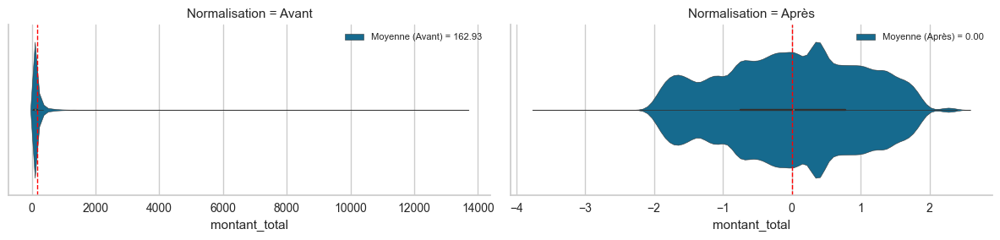

In [17]:
# Appel de la fonction
facet_violin_plot(Data, Data_clust_nom, 'montant_total')

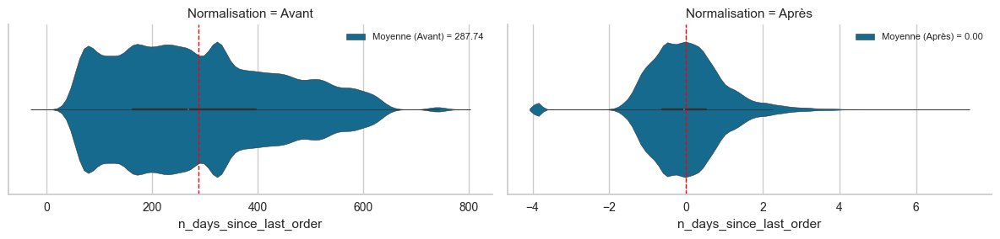

In [18]:
# Appel de la fonction
facet_violin_plot(Data, Data_clust_nom, 'n_days_since_last_order')

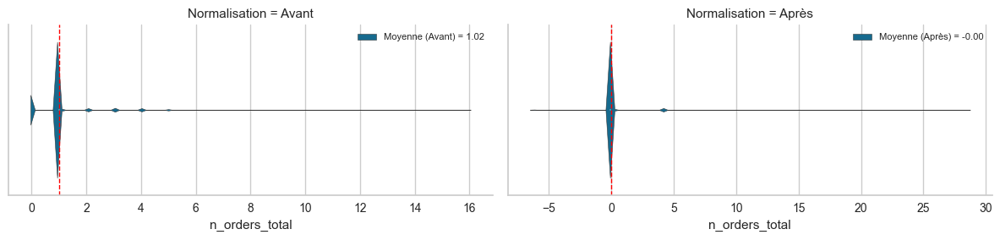

In [19]:
# Appel de la fonction
facet_violin_plot(Data, Data_clust_nom, 'n_orders_total')

##  détermination du nombre de cluster

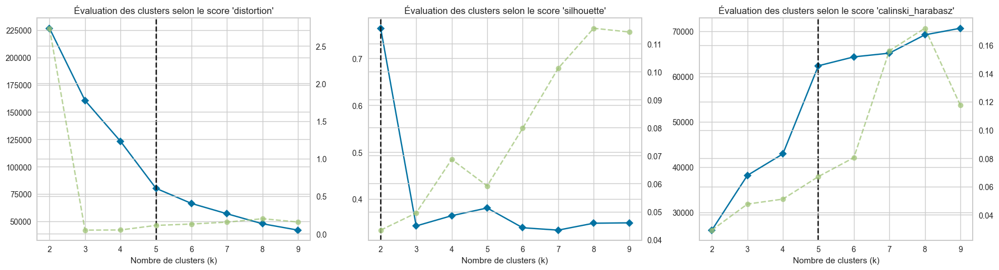

In [20]:
# Liste des scores à analyser
scoring_list = ['distortion', 'silhouette', 'calinski_harabasz']

# Définition du modèle
clust = KMeans(random_state=rdm_stt)

# Appel de la fonction
Graph_elbow(Data_clust, scoring_list, clust, preprocessor, 'Graph_distorsion_silhouette_Calinski_(KMeans_RFM)')

Les graphiques représentant l’évolution des scores de qualité de la segmentation en fonction du nombre de clusters montrent qu’au-delà de 5 clusters, l’amélioration de la distorsion devient marginale. Le score de Calinski-Harabasz augmente en fonction du nombre de clusters et atteint sa valeur maximale pour 9 clusters. On constate une forte amélioration du score entre 4 et 5 clusters qui tend à diminuer au dela. Le score de silhouette obtient quant à lui son meilleur score pour 2 clusters puis le suivant pour 5 clusters. Une segmentation à deux cluster ne permettrait pas d'identifier des caractéristiques suffisament fines pour être pertinenente d'un point de vue marketing. Le nombre de clusters optimal en fonction de ces trois scores correspondrait à 5. Il est à noter que le score de silhouette obtenu n'est que modérément satisfaisant. Ce résultat sera examiné plus en détail dans une section suivante, à travers une visualisation individuelle des scores de silhouette pour chaque observation, à l’aide de la méthode Silhouette Visualizer.

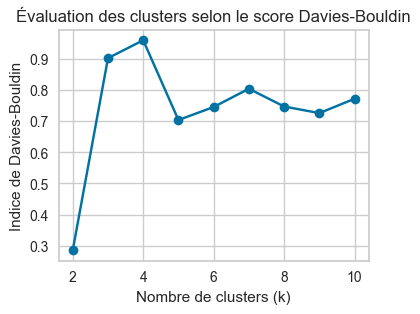

In [21]:
# Appel de la fonction
Davies_Bouldin_score(Data_clust, preprocessor, 'Graph_DaviesBouldin_(KMeans_RFM)')

L'analyse de l'évolution du score de Davies-bouldin montre que le meilleur score est obtenu pour une segmentation à 2 puis 5 cluster. Le nombre de clusters sera fixé à 5 pour les analyses suivantes

Score de silhouette moyen : 0.38073274454438377


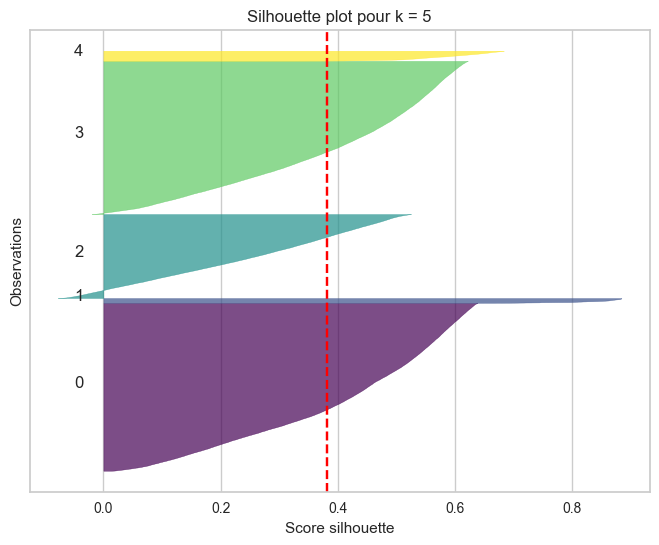

In [22]:
# Choix du nombre de cluster
nb_cluster = 5

# Définition du modèle
clust = KMeans(n_clusters=nb_cluster, random_state=rdm_stt)

# Appel de la fonction
graph_silhouette_score(Data_clust, preprocessor, clust, nb_cluster, 'Graph_Silouette_(KMeans_RFM)')

Le score moyen obtenu pour cette segmentation est légèrement inférieur à 0.4. Ce score indique une séparation des cluster qui est correct mais qui pourrait être améliorée. Le cluster 1 cluster a des scores de silhouette qui tendent vers 1 traduisant une structure bien définie et une bonne cohésion interne. En revanche, les clusters 0, 2 et 3 incluent un nombre important d’observations avec des scores plus faibles, ce qui peut refléter un chevauchement avec d’autres groupes ou une variabilité interne importante. Les clusters 2 et 3 contiennent par ailleurs des observations dont les scores de silhouette sont négatif ce qui indique que certaines observations ont pu être mal classée lors de la semgentation.

Afin de poursuivre l’analyse en évaluant la stabilité face à l'initialisation de l'agorithme du KMeans et en caractérisant plus finement les groupes identifiés , les étiquettes de cluster seront ajoutées au jeu de données, afin de relier chaque observation à son groupe d’appartenance.

## Modélisation et extraction des labels

In [23]:
# Choix du nombre de cluster
nb_cluster = 5

# Copie de la dataframe
Data_clust = Data_clust.copy()

# Définition du modèle à utiliser
clust = KMeans(n_clusters=nb_cluster, random_state=rdm_stt)

# Pipeline
pipeline_clust = Pipeline([
        ("preprocessor", preprocessor),
        ("clustering", clust)
    ])

# Ajout du label aux données
Data_clust.loc[:, 'cluster'] = pipeline_clust.fit_predict(Data_clust)

## Stabilité du modèle à l'initiation

L’étape d’initialisation de l’algorithme KMeans consiste à choisir les premiers centroïdes des k clusters que l’on souhaite construire. Cette étape est aléatoire, ce qui peut entraîner des segmentations variables si l'agoritme est relancé plusieurs fois.

Il existe différentes méthodes pour choisir ces centroïdes initiaux. Par défaut, l’algorithme KMeans de scikit-learn utilise la méthode K-means++. Dans ce cas, les centroïdes initiaux sont choisis de manière à être bien espacés, ce qui réduit le risque qu’ils soient trop proches les uns des autres ou qu’ils se situent dans des zones peu représentatives des données. Cette méthode garantit une meilleure dispersion des centroïdes initiaux, ce qui améliore la convergence de l’algorithme et la qualité du résultat final.

Cependant, cette étape reste partiellement aléatoire, il est donc important de vérifier que l’algorithme produit des résultats stables d’une exécution à l’autre. Pour cela, on peut comparer les labels obtenus lors de différentes segmentations issues de plusieurs initialisations.

Des mesures telles que le score ARI permettent d’évaluer la similarité entre deux segmentations indépendantes. Plus l’ARI est proche de 1, plus les segmentations sont similaires, indiquant une bonne stabilité. 

In [24]:
# Définition du modèle à analyser
clust = KMeans(n_clusters=nb_cluster)

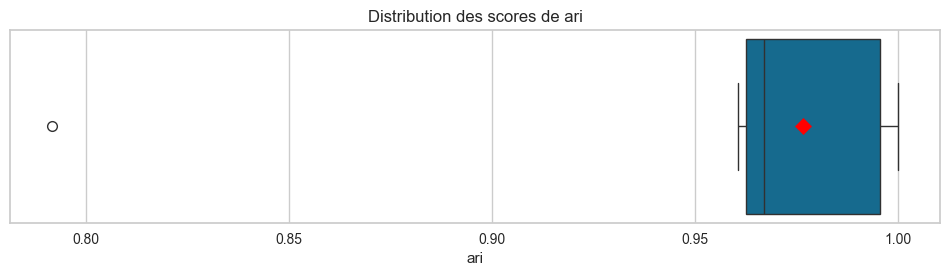

In [25]:
# Appel de la fonction
stabilite_initiation(Data_clust[Features_to_keep],
                     clust, preprocessor, 100,
                     Data_clust['cluster'],
                     adjusted_rand_score, 'ari',
                    "Boxplot_(KMeans_RFM)")

La distribution des scores d’ARI obtenus après 100 exécutions indépendantes de la segmentation montre une forte concentration des valeurs entre 0.96 et 1. Seul un point s'écarte de ces valeurs tout en restant très proche. Cette concentration élevée de valeurs comprise entre 0.96 et 1 indique une très bonne stabilité du processus de segmentation. Ainsi malgré les variations introduites par l’initialisation aléatoire, les groupes produits restent largement cohérents d’une exécution à l’autre. Cela suggère que la structure des données est bien captée par la méthode utilisée, et que les clusters identifiés sont robustes.

## Caractérisation des clusters

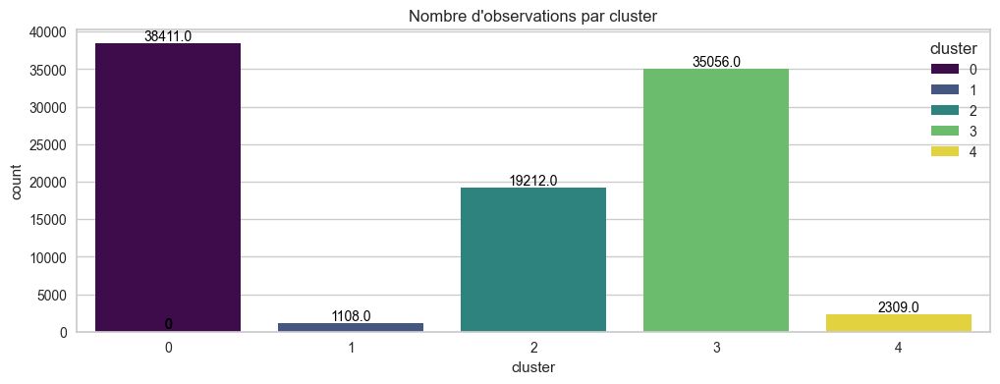

In [26]:
# Appel de la fonction
cluster_effectif(Data_clust, 'Effectif_(KMeans_RFM)')

L'analyse de la taille des groupes montre que la segmentation a conduit à la formation de deux groupes majoritaires rassemblant la majorité des observation ainsi qu'a deux groupes plus petits avec un nombre d'observation nettement inférieur.

Il est mainteant important de caractériser précisément chacun de ces groupes afin de comprendre le profil moyen des clients qu'ils représentent. Cela sera fait grâce à des représentations graphiques permettant de visualiser la distribution des variables utilisées lors de la segmentation en fonction des différents groupes identifiés.

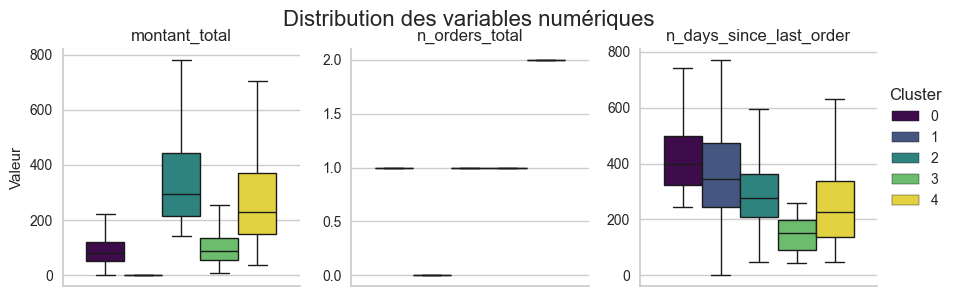

In [27]:
# Appel de la fonction
boxplot_by_cluster(Data_clust, 'Boxplot_(KMeans_RFM)')

In [28]:
# Calcul des moyennes par groupe pour chaque variable
Data_clust_mean = Data_clust.groupby('cluster').mean()

# Affichage de la dataframe
Data_clust_mean

,montant_total,n_orders_total,n_days_since_last_order
cluster,,,
0,90.486883,1.000000,413.142615
1,0.000000,0.000000,356.220217
2,411.145246,1.000000,294.664064
3,101.295099,1.000000,146.895339
4,316.851698,2.113036,249.702036


L'analyse des différents boxplots met en évidence des profils de client selon leur groupe d'appartenance.

- **cluster 0** : Ce groupe représente des clients avec un faible montant moyen ayant commandé une seule fois sur la plateforme d'Olist. Ils font partie des clients qui ont passé leur dernière commandes il y a le plus lontemps.

- **cluster 1** : Ce groupe représente les clients qui n'ont pas passé de commande effective, soit parce qu'ils ont annulée leur commmande soit parceque leur commande a rencontré un probleme logistique. En conséquence ces clients n'ont pas dépensé sur la plateforme d'Olist. Leur date de dernière tentative de commande ou de création de commande est très variable mais figure en moyenne au dessus de la majorité des groupes. 

- **cluster 2** : Ce groupe représente des clients qui ont également passés une seule commande sur la plateforme d'Olist mais qui ont dépensée plus d'argent sur cette commande que les clients des autres groupes. La dernière commande de ces clients est modérément récente par rapport aux autres groupes. 

- **cluster 3** : Ce groupe représente les clients qui ont passé une seule commande recement mais avec des montant plus faible que la plupart des autres groupes. 

- **cluster 4** : Ce groupe représente les clients plus actif qui ont passé en moyenne 2 commandes. Le montant dépensé par ces clients est plustot élevé mais variable et ils ont passé leur dernière commande en moyenne relativement récemment. 

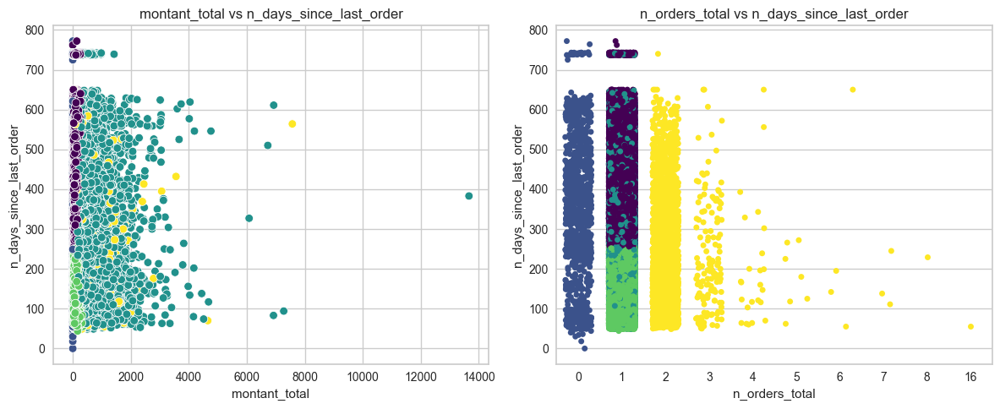

In [29]:
# Liste des paires de variables à analyser
variable_pairs = [
    ('montant_total', 'n_days_since_last_order'),
    ('n_orders_total', 'n_days_since_last_order')
]

# Liste des type de plot à construire pour chaque couple de variable
type_plot = [sns.scatterplot, sns.stripplot]

# # Appel de la fonction
scatterplot_subplots(Data_clust, variable_pairs, type_plot, "Scatterplot_(KMeans_RFM)")

Ces représentations graphiques permettent de visualiser les observations dans un espace bidimensionnel, défini par un couple d’indicateurs utilisés lors de la segmentation. Elles mettent en évidence la dispersion des individus selon ces deux variables. On observe alors que, malgré la présence d’overlap, les observations appartenant à un même cluster tendent à se regrouper ensemble dans chacun des deux espaces bidimensionnels représentés ici. La segmentation réalisée ici ayant été appliquée sur trois variables, il est également intéressant d’étudier la dispersion des observations dans un environnement en trois dimensions.

In [30]:
# Copie de la dataframe
Data_graph = Data_clust.copy()

# Conversion de la variable cluster en str
Data_graph['cluster_st'] = Data_graph['cluster'].astype(str)

# Définition de la correspondance des couleurs
color_dict_str = {
    '0': '#440154',
    '1': '#3e4989',
    '2': '#26828e',
    '3': '#1f9e89',
    '4': '#fde725'
}

# Construction du graphique
fig = px.scatter_3d(
    Data_graph,
    x='montant_total',
    y='n_days_since_last_order',
    z='n_orders_total',
    color='cluster_st',
    opacity=0.7,
    color_discrete_map=color_dict_str
)

# Titre du graphique
fig.update_layout(title='Représentation 3D des variables RFM')

# Affichage du graphiuqe
fig.show()

La représentation de la dispersion des observations dans un espace tridimensionnel, défini par les trois indicateurs utilisés lors de la segmentation, permet de mieux visualiser la structure des clusters. Cette projection permet d’identifier de façon plus précise les regroupements des différentes observations au sein de leur cluster et de réduire visuellement la superposition entre certains groupes que l’on a pu observer dans l'espace bidimensionnel. On observe que les observations se regroupent globament bien au sein de leur cluster respectif.

In [31]:
# Définition de la correspondance des couleurs
color_dict = {0: '#440154',
              1: '#3e4989',
              2: '#26828e',
              3: '#1f9e89',
              4: '#fde725'}

# Appel de la fonction
plot_radars(Data_clust, 'cluster', color_dict, "Radar_(KMeans_RFM)")

Cette représentation graphique offre une autre manière de comparer le profil client des différents cluster obtenus après segmentation. On retrouve alors les caractéristiques identifièes à la lecture des boxplots. 

# Deuxième segmentation: KMeans on RFM + avis clients

## Prétraitement des données

In [32]:
# Définition des variables à utiliser
Features_to_keep = ['montant_total', 'n_days_since_last_order', 'mean_review', 'n_orders_total']

# Variables à normaliser avec une normalisation PowerTransform
power_vars = [
    'n_days_since_last_order', 'n_orders_total',
    'montant_total']

# Variables à normaliser avec une normalisation MinMax
minmax_vars = ['mean_review']

# Définition de la chaine de prétraitement à effectuer
preprocessor = ColumnTransformer(transformers=[
    ('power', PowerTransformer(), power_vars),
    ('minmax', MinMaxScaler(), minmax_vars)
])

# Selection des variables à utiliser
Data_clust = Data[Features_to_keep]

# Normalisation des données
Data_clust_nom = pd.DataFrame(preprocessor.fit_transform(Data_clust), columns=Data_clust.columns)

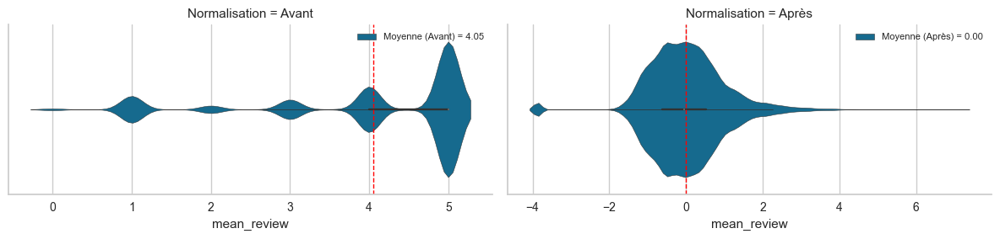

In [33]:
# Appel de la fonction
facet_violin_plot(Data, Data_clust_nom, 'mean_review')

##  détermination du nombre de cluster

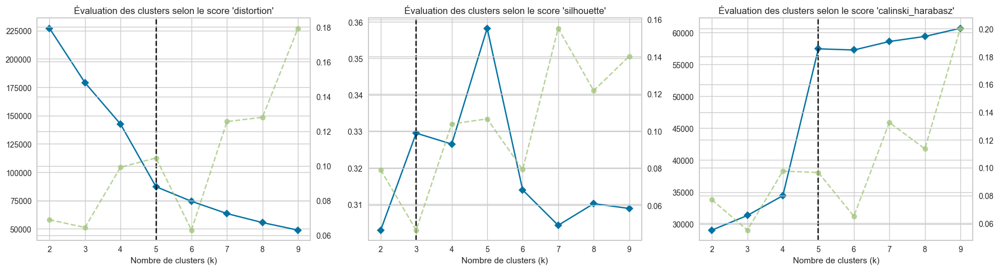

In [34]:
# Liste des scores à analyser
scoring_list = ['distortion', 'silhouette', 'calinski_harabasz']

# Définition du modèle
clust = KMeans(random_state=rdm_stt)

# Appel de la fonction
Graph_elbow(Data_clust, scoring_list, clust, preprocessor, 'Graph_distorsion_silhouette_Calinski_(KMeans_RFMA)')

À nouveau, les graphiques représentant l’évolution des scores de qualité de la segmentation en fonction du nombre de clusters montrent qu’au delà de 5 clusters, l’amélioration de la distorsion devient marginale. Comme précédemment, le score de Calinski-Harabasz augmente avec le nombre de clusters et atteint sa valeur maximale pour 9 clusters. On constate à nouveau une forte amélioration du score entre 4 et 5 clusters, qui tend à diminuer au-delà. Le meilleur score de silhouette est quant à lui obtenu pour 5 clusters. Il apparaît ainsi plus pertinent de s’orienter vers une segmentation en 5 clusters. Comme mentionné précédemment, il est à noter que le score de silhouette obtenu reste modérément satisfaisant. Ce résultat sera examiné plus en détail dans la section suivante, à travers une visualisation individuelle des scores de silhouette pour chaque observation, à l’aide de la méthode Silhouette Visualizer.

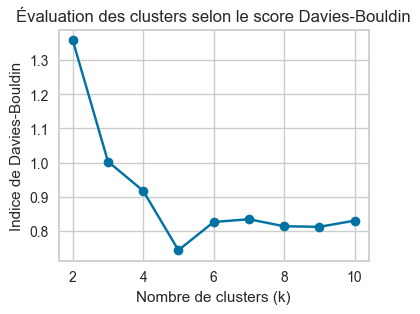

In [35]:
# Appel de la fonction
Davies_Bouldin_score(Data_clust, preprocessor, 'Graph_DaviesBouldin_(KMeans_RFMA)')

L’analyse de l’évolution du score de Davies-Bouldin montre que la segmentation en 5 clusters permet d’obtenir le meilleur score. Ce résultat est cohérent avec les conclusions précédemment obtenues à partir de la distorsion et du score de silhouette. Le nombre de clusters sera donc fixé à 5 pour les analyses suivantes.

Score de silhouette moyen : 0.3582660724536888


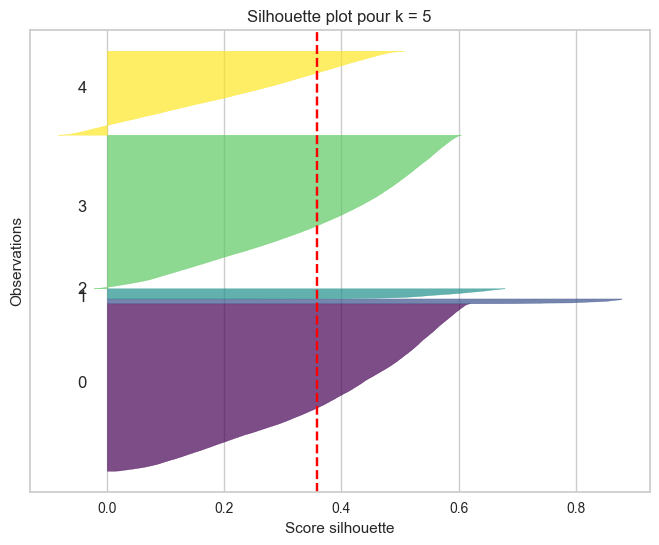

In [36]:
# Choix du nombre de cluster
nb_cluster = 5

# Définition du modèle
clust = KMeans(random_state=rdm_stt, n_clusters=nb_cluster)

# Appel de la fonction
graph_silhouette_score(Data_clust, preprocessor, clust, nb_cluster, 'Graph_Silouette_(KMeans_RFMA)')

Le score moyen obtenu pour cette segmentation se situe atour de 0.36. Ce score indique une séparation des cluster qui est correct mais non optimale. Un des clusters a des scores de silhouette qui tendent vers 0.9 traduisant une structure bien définie et une bonne cohésion interne. En revanche, les autres clusters incluent un nombre important d’observations avec des scores plus faibles, ce qui peut refléter un chevauchement avec d’autres groupes ou une variabilité interne importante. On note également la présence de score négatif au sein du cluster jaune ce qui suggèrent que certaines observation auraient pu être mal classées.

Afin de poursuivre l’analyse en évaluant la stabilité face à l'initialisation de l'agorithme du KMeans et en caractérisant plus finement les groupes identifiés, les étiquettes de cluster seront ajoutées au jeu de données, afin de relier chaque observation à son groupe d’appartenance.

## Modélisation et extraction des labels

In [37]:
# Choix du nombre de cluster
nb_cluster = 5

# Copie de la dataframe
Data_clust = Data_clust.copy()

# Définition du modèle à utiliser
clust = KMeans(n_clusters=nb_cluster, random_state=rdm_stt)

# Pipeline
pipeline_clust = Pipeline([
        ("preprocessor", preprocessor),
        ("clustering", clust)
    ])

# Ajout du label aux données
Data_clust.loc[:, 'cluster'] = pipeline_clust.fit_predict(Data_clust)

## Stabilité du modèle à l'initiation

In [38]:
# Définition du modèle à analyser
clust = KMeans(n_clusters=nb_cluster)

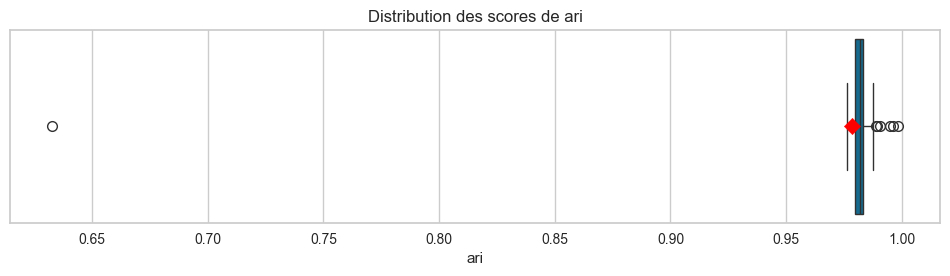

In [39]:
# Appel de la fonction
stabilite_initiation(Data_clust[Features_to_keep],
                     clust, preprocessor, 100,
                     Data_clust['cluster'],
                     adjusted_rand_score, 'ari',
                    "Boxplot_(KMeans_RFMA)")

La distribution des scores d’ARI obtenus après 100 exécutions indépendantes de la segmentation montre que la majorité des valeurs se situent entre 0.97 et 1 suggérant une stabilité très satisfaisante de l'agorithme. Seul un point s'écarte de ces valeurs tout en restant supérieur à 0.8. Les scores obtenus sont similaires à ceux observés lors de la segmentation précédente. Les mêmes conclusions peuvent être émises. Ainsi on peut conclure qu'on a une très bonne stabilité de la segmentation face à l'itinialisation.

## Caractérisation des clusters

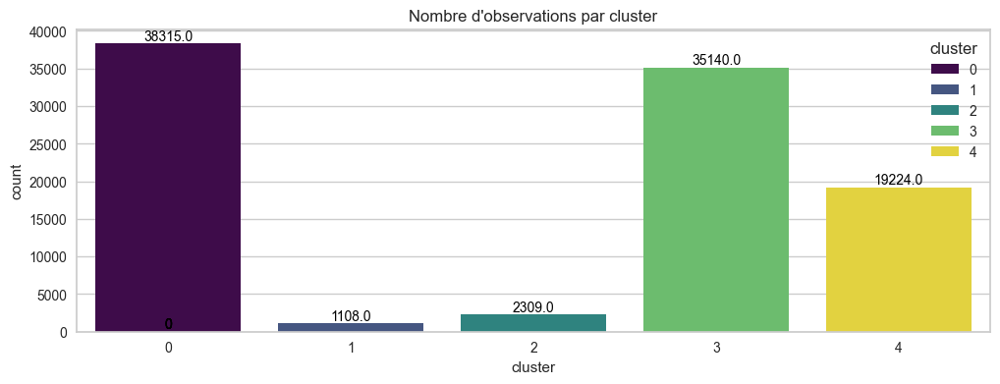

In [40]:
# Appel de la fonction
cluster_effectif(Data_clust, 'Effectif_(KMeans_RFMA)')

L’analyse de la taille des groupes montre que cette segmentation a également conduit à la formation de deux groupes majoritaires, rassemblant la majorité des observations, ainsi qu’à deux groupes plus petits, avec un nombre d’observations nettement inférieur.

Il est maintenant important de caractériser précisément chacun de ces groupes, afin de comprendre le profil moyen des clients qu’ils représentent. Cela sera fait grâce à des représentations graphiques permettant de visualiser la distribution des variables utilisées lors de la segmentation, en fonction des différents groupes identifiés.

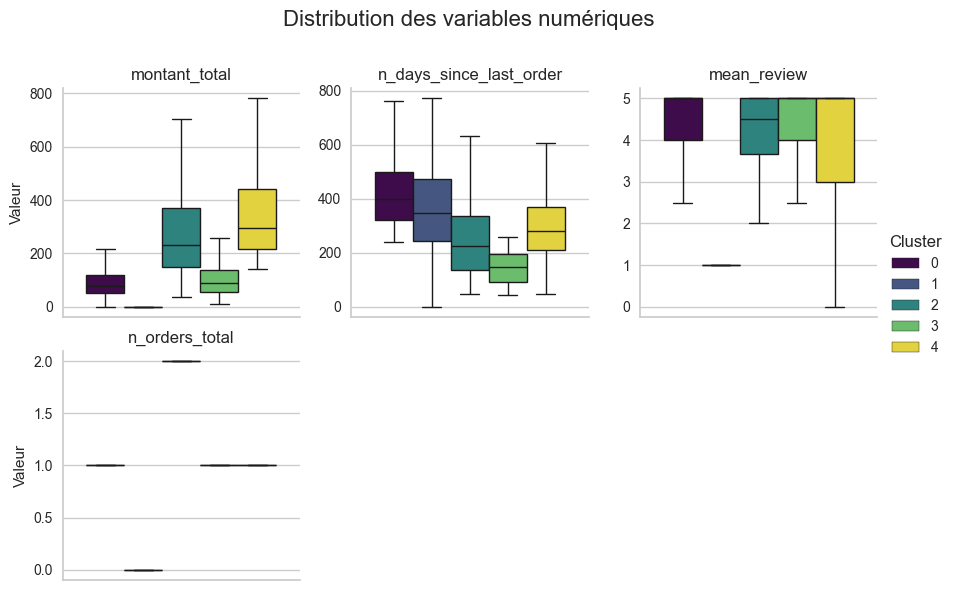

In [41]:
# Appel de la fonction
boxplot_by_cluster(Data_clust, 'Boxplot_(KMeans_RFMA)')

In [42]:
# Calcul de la moyenne de toutes les variables par cluster, sans filtre
mean_all = Data_clust.groupby('cluster').mean()

#  Calcul de la moyenne de mean review en excluant les 0
mean_var1_nozero = Data_clust[Data_clust['mean_review'] != 0].groupby('cluster')['mean_review'].mean()

# Remplacement de la colonne mean_review dans mean_all par cette nouvelle moyenne filtrée
mean_all['mean_review'] = mean_var1_nozero

# Affichage du résultat final
pd.DataFrame(mean_all)

,montant_total,n_days_since_last_order,mean_review,n_orders_total
cluster,,,,
0,89.364878,411.963435,4.153780,1.000000
1,0.000000,356.220217,1.585887,0.000000
2,316.851698,249.702036,4.241691,2.113036
3,102.658597,146.411696,4.171590,1.000000
4,410.641734,299.135664,3.910955,1.000000


In [43]:
# Copie de la dataframe
Data_graph = Data_clust.copy()

# Conversion de la variable cluster en str
Data_graph['cluster_st'] = Data_graph['cluster'].astype(str)

# Définition de la correspondance des couleurs
color_dict_str = {
    '0': '#440154',
    '1': '#3e4989',
    '2': '#26828e',
    '3': '#1f9e89',
    '4': '#fde725'
}

# Construction du graphiuqe
fig = px.scatter_3d(
    Data_graph,
    x='montant_total',
    y='n_days_since_last_order',
    z='n_orders_total',
    color='cluster_st',
    opacity=0.7,
    color_discrete_map=color_dict_str
)

# Ajout du titre
fig.update_layout(title='Représentation 3D des variables RFM')

# Affichage du graphique
fig.show()


In [44]:
# Définition de la liste de couleur
color_dict = {0: '#440154',
              1: '#3e4989',
              2: '#26828e',
              3: '#1f9e89',
              4: '#6ece58',
              5: '#fde725'}

# Appel de la fonction
plot_radars(Data_clust, 'cluster', color_dict, 'KMeans_RFMA')

L’analyse des différents boxplots met en évidence plusieurs profils de clients selon leur groupe d’appartenance

- **cluster 0** : Ce groupe représente des clients avec un faible montant moyen dépensé, ayant commandé une seule fois sur la plateforme d'Olist. Ils font partie des clients qui ont passé leur dernière commandes il y a le plus lontemps. Ces clients sont globalement satisfaits.

- **cluster 1** : Ce groupe correspond à des clients n’ayant pas passé de commande effective, soit en raison d’annulations, soit parce que leur commande a rencontré des problèmes logistiques. En conséquence ces clients n'ont pas dépensé d'argent sur la plateforme d'Olist. Leur date de dernière tentative ou de création de commande est très variable, mais en moyenne plus ancienne que dans les autres groupes. Ces clients sont plutôt insatisfaits du fait des différents problèmes rencontrés.

- **cluster 2** : Ce groupe représente les clients les plus actifs qui ont passé en moyenne 2 commandes. Le montant dépensé par ces clients est plutôt élevé en moyenne  mais aussi plus variable. ils ont passé leur dernière commande relativement recemment . Ce sont les clients qui sont en moyenne le plus satisfaits.

- **cluster 3** : Ce groupe représente également des clients ayant passé une seule commande avec un faible montant moyen sur la plateforme d'Olist, mais leur dernière commande est plus récente par rapport aux autres groupes. Ces clients sont globalement satisfaits.

- **cluster 4**: Ce groupe rassemble des clients ayant également passé seulement une commande mais avec des montants légèrement plus élevés. Leur nombre de jour écoulé depuis leur commande est variable avec une moyenne intermédiaire entre les deux premiers groupe. Ces clients sont globalement satisfaits, bien que certains n’aient pas laissé d’évaluation (il s'agit de ceux dont la moyenne des notes a été imputé à 0).

# Troisième segmentation: KMeans on RFMA + délais livraison + nombre de commande annulée

## Prétraitement des données

In [45]:
# Définition des variables à utiliser
Features_to_keep = ['montant_total', 'n_days_since_last_order', 'mean_review', 'n_orders_total',
                    'n_days_delivery_delayed_by_order', 'n_canceled_order']

# Variables à normaliser avec une normalisation PowerTransform
power_vars = [
    'n_days_since_last_order', 'n_orders_total',
    'montant_total', 'n_days_delivery_delayed_by_order']

# Variables à normaliser avec une normalisation MinMax
minmax_vars = ['mean_review']

# Variables binaire à ne pas normaliser
no_norm_var = ['n_canceled_order']

# Définition de la chaine de prétraitement à effectuer
preprocessor = ColumnTransformer(transformers=[
    ('power', PowerTransformer(), power_vars),
    ('minmax', MinMaxScaler(), minmax_vars),
    ('passthrough', 'passthrough', no_norm_var)
])

# Selection des variables à utiliser
Data_clust = Data[Features_to_keep]

# Normalisation des données
Data_clust_nom = pd.DataFrame(preprocessor.fit_transform(Data_clust), columns=Data_clust.columns)

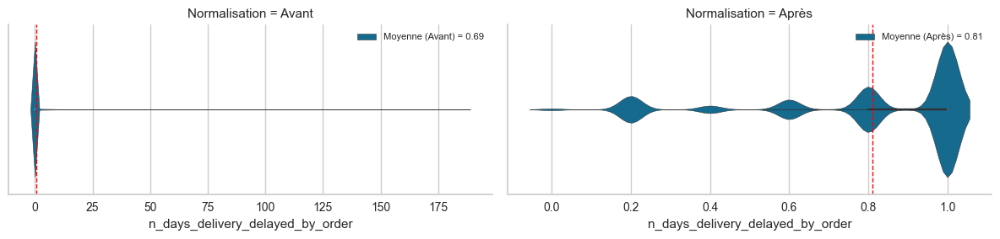

In [46]:
# Appel de la fonction
facet_violin_plot(Data, Data_clust_nom, 'n_days_delivery_delayed_by_order')

##  détermination du nombre de cluster

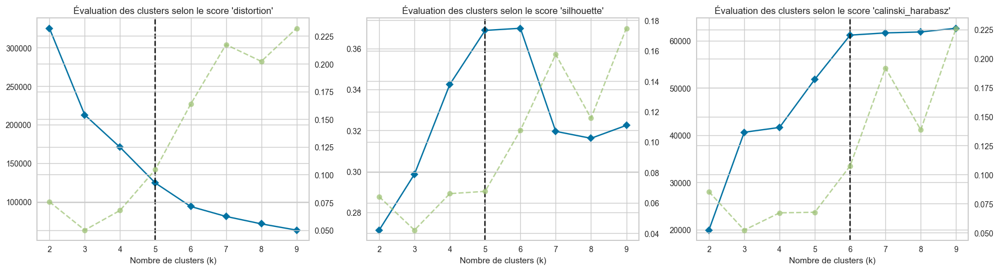

In [47]:
# Liste des scores à analyser
scoring_list = ['distortion', 'silhouette', 'calinski_harabasz']

# Définition du modèle
clust = KMeans(random_state=rdm_stt)

# Appel de la fonction
Graph_elbow(Data_clust, scoring_list, clust, preprocessor, 'Graph_distorsion_silhouette_Calinski_(KMeans_RFMADC)')

Ici, les graphiques représentant l’évolution des scores de qualité de la segmentation en fonction du nombre de clusters montrent à nouveau qu’au delà de 5 clusters, l’amélioration de la distorsion devient marginale. Le meilleur score de silhouette est obtenu pour 6 puis 5 clusters. Concernant le score de Calinski-Harabasz, on observe une augmentation du score au cours du temps marqué par une nette amélioration des scores entre 5 et 6 clusters qui tend à diminuer au delà.  Comme mentioné précédemment, il est à noter que le score de silhouette obtenu n'est que modérément satisfaisant. Ce résultat sera examiné plus en détail dans la section suivante, à travers une visualisation individuelle des scores de silhouette pour chaque observation, à l’aide de la méthode Silhouette Visualizer.

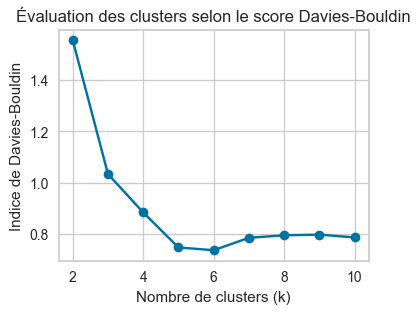

In [48]:
# Appel de la fonction
Davies_Bouldin_score(Data_clust, preprocessor, 'Graph_DaviesBouldin_(KMeans_RFMADC)')

L’analyse de l’évolution du score de Davies-Bouldin montre que la segmentation en 6 clusters permet d’obtenir le meilleur score. Ce résultat est cohérent avec les conclusions précédemment obtenues à partir du score de silhouette et de Calinsky-Harabasz. Le nombre de clusters sera donc fixé à 6 pour les analyses suivantes.

Score de silhouette moyen : 0.36984750281857287


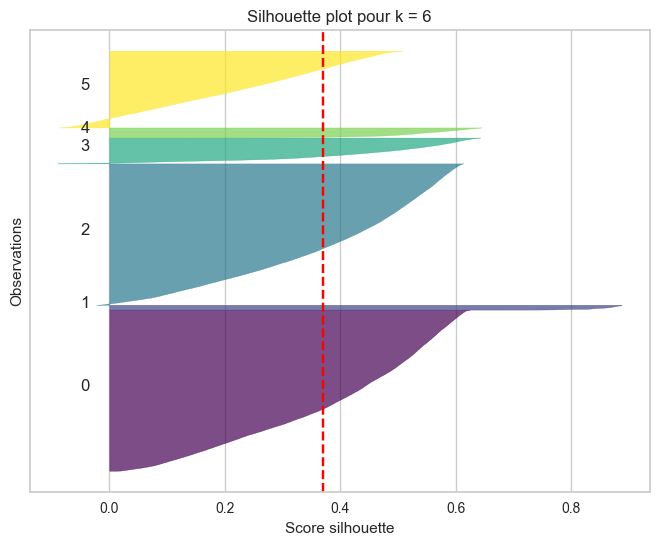

In [49]:
# Choix du nombre de cluster
nb_cluster = 6

# Définition du modèle
clust = KMeans(random_state=rdm_stt, n_clusters=nb_cluster)

# Appel de la fonction
graph_silhouette_score(Data_clust, preprocessor, clust, nb_cluster, 'Graph_Silouette_(KMeans_RFMADC)')

La valeur moyenne du coefficient de silhouette obtenu pour cette segmentation se situe autour de 0.37. Ce score est modérément statisfaisant, ce qui signifie que le clustering est acceptable, mais pas optimal en termes de séparation entre les groupes et de cohésion interne. 

Les clusters 1, 3 à 4 sont très fins ce qui indique qu'ils contiennent peu d'observation. Toutefois, leur coefficient de silhouette plus élevé traduit une bonne cohésion interne.
Les clusters 0 et 1, plus larges, regroupent un nombre important d’observations, mais présentent des valeurs de silhouette globalement plus faibles, témoignant d’une cohésion interne plus faible ou d’une proximité avec d’autres clusters.
Le cluster 2 apparaît plus problématique, car il contient plusieurs observations avec des coefficients de silhouette négatifs, ce qui suggère des affectations incorrectes (ces points seraient plus proches d’un autre cluster que du leur).

Afin de poursuivre l’analyse en évaluant la stabilité face à l'initialisation de l'agorithme du KMeans et en caractérisant plus finement les groupes identifiés , les étiquettes de cluster seront ajoutées au jeu de données, afin de relier chaque observation à son groupe d’appartenance.

## Modélisation et extraction des labels

In [50]:
# Choix du nombre de cluster
nb_cluster = 6

# Copie de la dataframe
Data_clust = Data_clust.copy()

# Définition du modèle à utiliser
clust = KMeans(n_clusters=nb_cluster, random_state=rdm_stt)

# Pipeline
pipeline_clust = Pipeline([
        ("preprocessor", preprocessor),
        ("clustering", clust)
    ])

# Ajout du label aux données
Data_clust.loc[:, 'cluster'] = pipeline_clust.fit_predict(Data_clust)

## Stabilité du modèle à l'initiation

In [51]:
# Définition du modèle à analyser
clust = KMeans(n_clusters=nb_cluster)

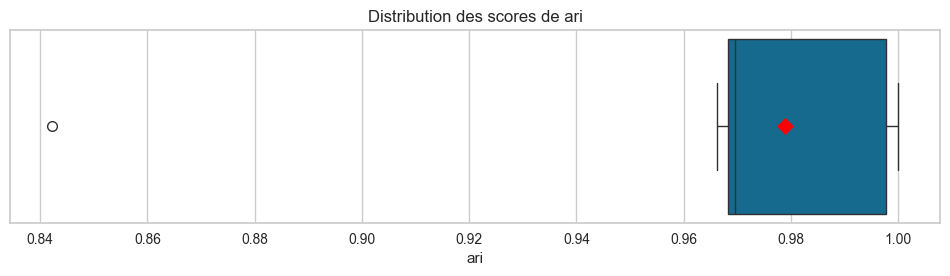

In [52]:
# Appel de la fonction
stabilite_initiation(Data_clust[Features_to_keep], clust, preprocessor, 100, 
                     Data_clust['cluster'], adjusted_rand_score, 'ari',
                    "Boxplot_(KMeans_RFMADC)")

La distribution des scores d’ARI obtenus après 100 exécutions indépendantes de la segmentation montre que les valeurs se situent entre 0.95 et 1 suggérant une stabilité très satisfaisante de l'agorithme. Les scores obtenus sont similaire à ceux observés lors de la segmentation précédente. Ainsi, malgré la nature aléatoire de l’initialisation, la segmentation produite par K-means restent ici très similaire d’une exécution à l’autre, avec peu de variations dans l’attribution des points aux clusters.

## Caractérisation des clusters

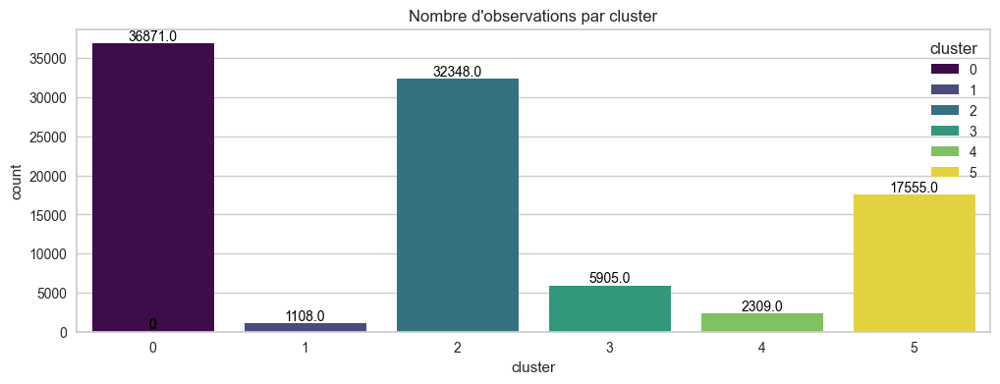

In [53]:
# Appel de la fonction
cluster_effectif(Data_clust, 'Effectif_(KMeans_RFMADC)')

Comme observé précédement lors de l'analyse du score de silhouette, l'analyse de la taille des groupes montre que la segmentation a conduit à la formation de deux groupes majoritaires rassemblant plus de 70% des observations ainsi qu'a deux groupes plus petits avec un nombre d'observations nettement inférieur représentant moins de 10% du jeu de données.

Il est mainteant important de caractériser précisément chacun de ces groupes afin de comprendre le profil moyen des clients qu'ils représentent. Cela sera fait grâce a des représentation graphique permettant de visualiser la distribution des variables utilisées lors de la segmentation en fonction des différents groupes identifiés.

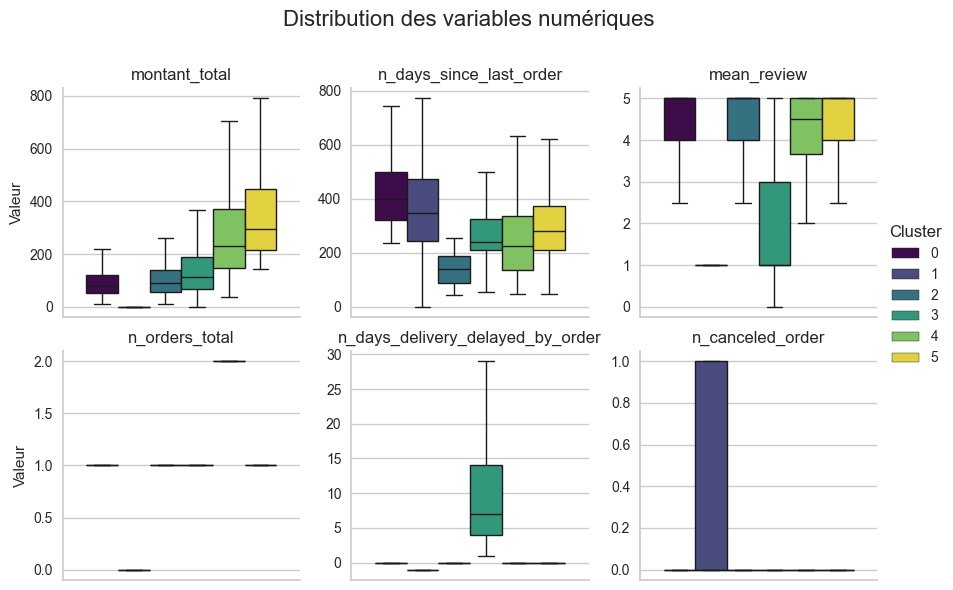

In [54]:
# Appel de la fonction
boxplot_by_cluster(Data_clust, 'Boxplot_(KMeans_RFMADC)')

In [55]:
# Calcul de la moyenne de toutes les variables par cluster, sans filtre
mean_all = Data_clust.groupby('cluster').mean()

# Calcul de la moyenne de mean_review en excluant les 0 (clients n'ayant pas laissé d'avis)
mean_var1_nozero = Data_clust[Data_clust['mean_review'] != 0].groupby('cluster')['mean_review'].mean()

# Remplacement la colonne mean_review dans mean_all par cette nouvelle moyenne filtrée
mean_all['mean_review'] = mean_var1_nozero

# Affichage de la dataframe
mean_all

,montant_total,n_days_since_last_order,mean_review,n_orders_total,n_days_delivery_delayed_by_order,n_canceled_order
cluster,,,,,,
0,89.564589,412.569363,4.246737,1.000000,0.002414,0.000244
1,0.000000,356.220217,1.585887,0.000000,-1.000000,0.485560
2,103.212363,142.457648,4.312136,1.000000,0.004204,0.000309
3,170.573309,270.619983,2.163950,1.000000,11.194242,0.000339
4,316.851698,249.702036,4.241691,2.113036,0.515164,0.001732
5,414.544588,299.731928,4.094806,1.000000,0.006893,0.000456


L’analyse des différents boxplots met en évidence plusieurs profils de clients selon leur groupe d’appartenance. Les distributions observées sur les variables précédemment analysées sont globalement similaires, mais l’ajout du retard moyen de livraison apporte une information supplémentaire permettant d’expliquer plus finement le niveau d’insatisfaction de certains clients.

- **cluster 0** : Ce groupe représente des clients ayant passé une seule commande sur la plateforme d'Olist avec un montant moyen faible. Il s'agit des clients qui ont passé leur dernière commande il y a le plus longtemps. Ces clients sont globalement très satisfaits et n’ont pas connu de retard de livraison.

- **cluster 1** : Ce groupe correspond à des clients n’ayant pas passé de commande effective, soit en raison d’annulations, soit parce que leur commande a rencontré un problème logistique. En conséquence ces clients n'ont pas dépensé d'argent sur la plateforme d'Olist. Leur date de dernière tentative de commande est très variable, mais en moyenne plus ancienne que celle observée dans les autres groupes. Ces clients sont plutôt insatisfaits ce qui pourrait être dû aux éventuels problème logistiques ou erreurs lors de leur commande qui ont pu arriver. 

- **cluster 2** : Ce groupe représente également des clients ayant passé une seule commande avec un montant faible sur la plateforme d'Olist, mais leur date d'achat est plus récente par rapport aux autres groupes. Leur niveau de satisfaction est élevé, et aucune annulation de commande n’a été observé. Les retard de livraison de ces clients apparaissent négligeable.

- **cluster 3** : Ce groupe rassemble des clients ayant également passé seulement une commande mais avec un montants intermédiaire par rapport aux autres groupe caractérisés par une commande unique. Le temps écoulé depuis leur commnande se situe également à un niveau intermédiaire par rapport aux autres groupe avec une seule commande. Ils sont marqués par un retard moyen de livraison élevé (le seul groupe concerné), ce qui explique probablement leur niveau de satisfaction très variable mais globalement plus faible que celle observée dans la majorité des autres groupes. Ce groupe pourrait représenter des clients déçus par leur unique expérience d’achat.

- **cluster 4** : Ce groupe représente les clients les plus actifs, avec en moyenne plus de deux commandes passées. Ce sont aussi ceux qui ont dépensé le plus, bien que les montants soient plus variables. Leur dernière commande est récente, ils sont très satisfaits, et n’ont pas subi de retard de livraison significatif. Ce groupe représente les clients fidèles de la plateforme.

- **cluster 5**: Ce groupe rassemble des clients ayant également passé seulement une commande mais avec des montants plus élevés. Ce sont les clients qui ont le plus dépensé sur la plateforme d'Olist. Leur nombre de jour écoulé depuis leur commande est variable avec une moyenne intermédiaire entre les deux premiers groupes. Ces clients sont globalement satisfaits, bien que certains n’aient pas laissé d’évaluation (il s'agit de ceux dont la moyenne des notes a été imputée à 0). Ces clients n'ont également pas connu de retard de livraison. Ce sont des clients à fort potentiel.


In [56]:
# Copie de la dataframe
Data_graph = Data_clust.copy()

# Conversion de la variable cluster en str
Data_graph['cluster_st'] = Data_graph['cluster'].astype(str)

# Définition de la correspondance des couleurs
color_dict = {'0': '#440154',
              '1': '#3e4989',
              '2': '#26828e',
              '3': '#1f9e89',
              '4': '#6ece58',
              '5': '#fde725'}

# Construction du graphique
fig = px.scatter_3d(
    Data_graph,
    x='montant_total',
    y='n_days_since_last_order',
    z='n_orders_total',
    color=Data_clust['cluster'].astype(str),
    opacity=0.7,
    color_discrete_map=color_dict
)

# Ajout du titre
fig.update_layout(title='Représentation 3D des variables RFM')

# Affichage du graphique
fig.show()


In [57]:
# Prétraitement des données avec le preprocessor déjà entrainé
Data_clust_preprocessed = preprocessor.transform(Data_clust[Features_to_keep])

# Réduction de dimension avec la méthode umap
Data_clust_umap = UMAP(n_components=2, random_state=rdm_stt).fit_transform(Data_clust_preprocessed)

# Réduction de dimension avec la méthode TSNE
Data_clust_TSNE = TSNE(n_components=2,
                       random_state=rdm_stt,
                       perplexity=30,
                       learning_rate='auto',
                       init='pca').fit_transform(Data_clust_preprocessed)


C:\Users\33647\anaconda3\envs\env_01\lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



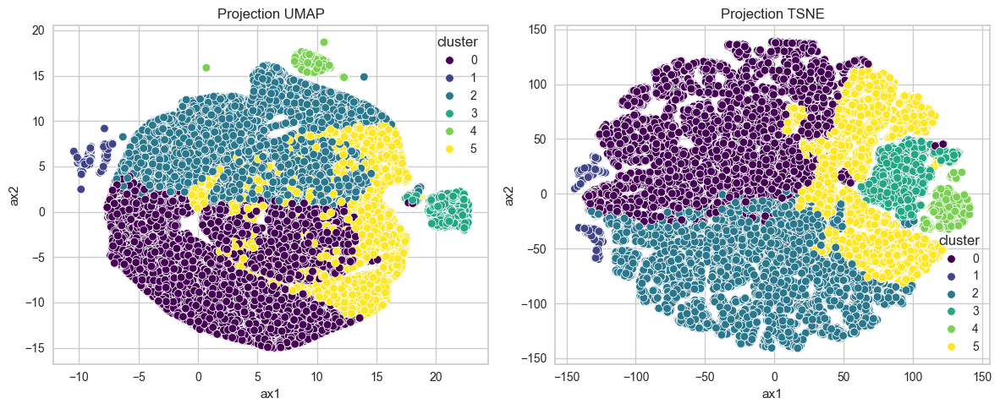

In [58]:
import warnings

warnings.filterwarnings(
    "ignore",
    message="Creating legend with loc=\"best\" can be slow*"
)

# Création des dataframe
Data_clust_umap_df = pd.DataFrame(Data_clust_umap, columns=["ax1", "ax2"])
Data_clust_umap_df["cluster"] = Data_clust["cluster"].values

Data_clust_TSNE_df = pd.DataFrame(Data_clust_TSNE, columns=["ax1", "ax2"])
Data_clust_TSNE_df["cluster"] = Data_clust["cluster"].values

# Création des graphiques
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes = axes.flatten()

sns.scatterplot(data=Data_clust_umap_df, x="ax1", y="ax2", hue="cluster", palette="viridis", ax=axes[0])
axes[0].set_title("Projection UMAP")

sns.scatterplot(data=Data_clust_TSNE_df, x="ax1", y="ax2", hue="cluster", palette="viridis", ax=axes[1])
axes[1].set_title("Projection TSNE")

# Ajustement des graphique
plt.tight_layout()

# Sauvegarde des graphique
plt.savefig(f'../Output/Projection/projections_(KMeans_RFMADC).png', format='png')

# Affichage du graphique
plt.show()

In [59]:
# Définition de la liste de couleur
color_dict = {0: '#440154',
              1: '#3e4989',
              2: '#26828e',
              3: '#1f9e89',
              4: '#6ece58',
              5: '#fde725'}

# Appel de la fonction
plot_radars(Data_clust, 'cluster', color_dict, "Radar_(KMeans_RFMADC)")

# Quatrième segmentation: KMeans on RFMADC + autres variables numériques

## Prétraitement des données

In [60]:
# Définition des variables à utiliser
Features_to_keep = ['montant_total', 'n_days_since_last_order', 'mean_review', 'mean_shipping_price_prop_by_order',
                    'n_days_delivery_delayed_by_order', 'mean_n_items_by_order', 'n_orders_total',
                    'n_days_btwn_pymt_and_est_delivery_by_order', 'n_canceled_order']

# Variables à normaliser avec une normalisation PowerTransform
power_vars = [
    'n_days_since_last_order', 'n_orders_total',
    'montant_total', 'mean_n_items_by_order',
    'n_days_delivery_delayed_by_order',
    'n_days_btwn_pymt_and_est_delivery_by_order']

# Variable à normaliser avec une normalisation StandardScaler
standard_vars = ['mean_shipping_price_prop_by_order']

# Variables à normaliser avec une normalisation MinMax
minmax_vars = ['mean_review', 'n_canceled_order']

# Définition de la chaine de prétraitement à effectuer
preprocessor = ColumnTransformer(transformers=[
    ('power', PowerTransformer(), power_vars),
    ('standard', StandardScaler(), standard_vars),
    ('minmax', MinMaxScaler(), minmax_vars)
])

# Selection des variables à utiliser
Data_clust = Data[Features_to_keep]

# Normalisation des données
Data_clust_nom = pd.DataFrame(preprocessor.fit_transform(Data_clust), columns=Data_clust.columns)

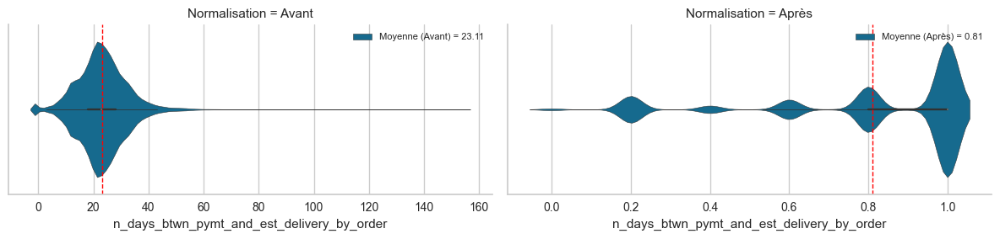

In [61]:
# Appel de la fonction
facet_violin_plot(Data, Data_clust_nom, 'n_days_btwn_pymt_and_est_delivery_by_order')

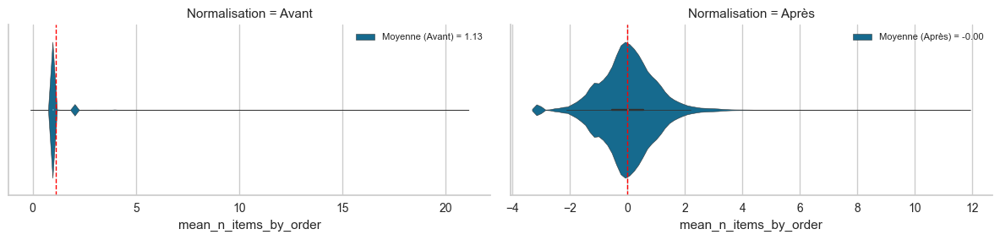

In [62]:
# Appel de la fonction
facet_violin_plot(Data, Data_clust_nom, 'mean_n_items_by_order')

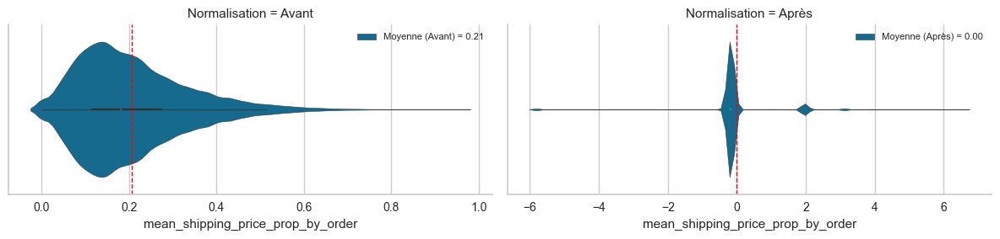

In [63]:
# Appel de la fonction
facet_violin_plot(Data, Data_clust_nom, 'mean_shipping_price_prop_by_order')

##  détermination du nombre de cluster

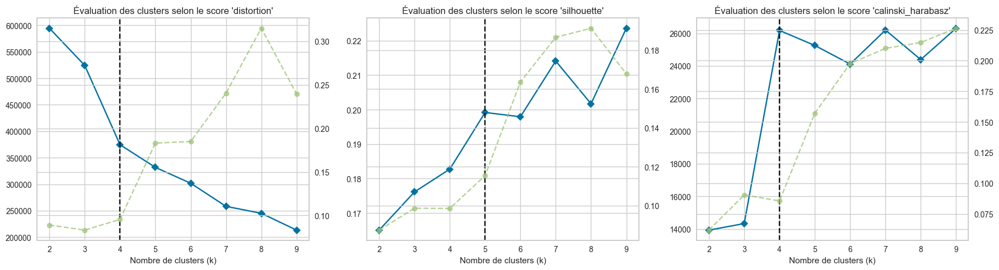

In [64]:
# Liste des scores à analyser
scoring_list = ['distortion', 'silhouette', 'calinski_harabasz']

# Définition du modèle
clust = KMeans(random_state=rdm_stt)

# Appel de la fonction
Graph_elbow(Data_clust, scoring_list, clust, preprocessor, 'Graph_distorsion_silhouette_Calinski_(KMeans_RFMADC+)')

Lorsque toutes les variables quantitatives sont utilisées, les graphiques représentant l’évolution des scores de qualité de la segmentation en fonction du nombre de clusters montrent qu’au delà de 4 clusters, l’amélioration de la distorsion devient marginale. Le meilleur score de silhouette est obtenu pour 9 puis 7 puis 8 puis 5 clusters. Concernant le score de Calinski-Harabasz, trois valeurs de k ressortent avec des scores élevés : 4, 7 et 9. Le choix du nombre optimal de clusters apparaît donc plus délicat dans ce cas. D’un point de vue qualitatif, il serait pertinent de fixer le nombre de clusters à 7, car cette valeur représente un compromis acceptable entre les différents scores. Toutefois, ce choix soulève des questions en termes d’exploitabilité, car un nombre élevé de clusters peut complexifier l’interprétation et l’action marketing. Il est à noter que le score de silhouette obtenu ici est le moins bon obtenu jusqu'à mainteant. Pour 7 cluster, il est seulement légèrement supérieur 0.21 ce qui traduit généralement des clusters avec une mauvaise cohésion interne et/ou une mauvaise séparation intercluster. Ce résultat sera examiné plus en détail dans la section suivante, à travers une visualisation individuelle des scores de silhouette pour chaque observation, à l’aide de la méthode Silhouette Visualizer.

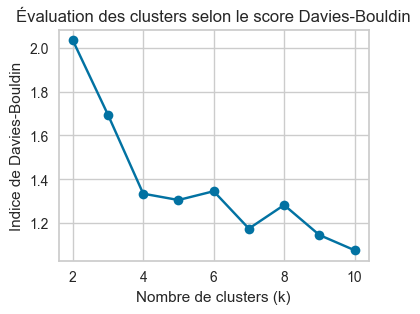

In [65]:
# Appel de la fonction
Davies_Bouldin_score(Data_clust, preprocessor, 'Graph_DaviesBouldin_(KMeans_RFMADC+)')

Ici, l’analyse de l’évolution du score de Davies-Bouldin indique que la segmentation en 7 clusters permet d’obtenir le troisième meilleur score après 9 et 10. Ce résultat, combiné aux autres indicateurs, oriente le choix vers 7 clusters afin de maximiser la qualité de la segmentation qui apparait déjà faible si l'on considère le score de silhouette et de Davies_Bouldin. Le nombre de clusters est donc fixé à 7 pour les analyses suivantes.

Score de silhouette moyen : 0.21409635768181895


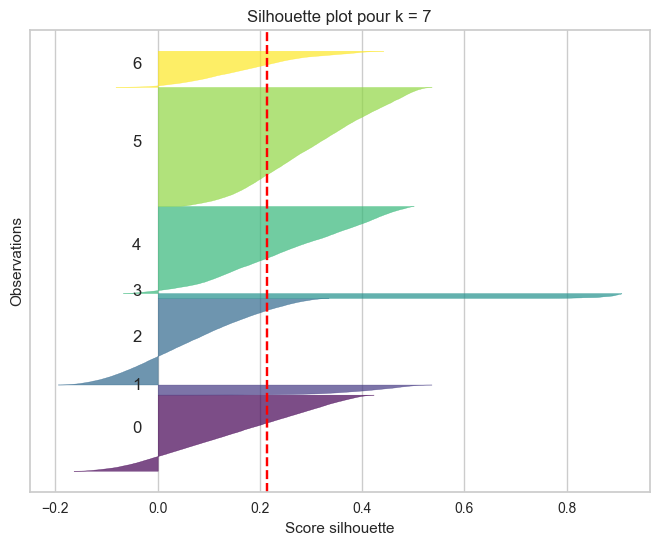

In [66]:
# Choix du nombre de cluster
nb_cluster = 7

# Définition du modèle
clust = KMeans(random_state=rdm_stt, n_clusters=nb_cluster)

# Appel de la fonction
graph_silhouette_score(Data_clust, preprocessor, clust, nb_cluster, 'Graph_Silouette_(KMeans_RFMADC+)')

Ce score est relativement faible et se situe à la limite inférieure d’un clustering pertinent, suggérant que la séparation entre les groupes est peu marquée.

Les clusters 1 et 5 sont très fins ce qui indique qu'ils contiennent peu d'observation. Le coefficient de silhouette du cluster 1 est proche de 1 pour toutes les observations. Il ne dépasse pas 0.5 pour le cluster 5.
Le cluster 4 est le cluster le plus large et est donc celui qui regroupe le plus d'observation. Il dépasse à peine 0.40 pour le score de silhouette maximum observé dans ce groupe. 
Les cluster 0, 2 et 3 ont une taille intermédaire avec des scores de silhouettes qui restent globalement faible. On observe des scores négatif pour deux d'entre eux. 

Afin de poursuivre l’analyse en évaluant la stabilité face à l'initialisation de l'agorithme du KMeans et en caractérisant plus finement les groupes identifiés , les étiquettes de cluster seront ajoutées au jeu de données, afin de relier chaque observation à son groupe d’appartenance.

## Modélisation et extraction des labels

In [67]:
# Choix du nombre de cluster
nb_cluster = 7

# Copie de la dataframe
Data_clust = Data_clust.copy()

# Définition du modèle à utiliser
clust = KMeans(n_clusters=nb_cluster, random_state=rdm_stt)

# Pipeline
pipeline_clust = Pipeline([
        ("preprocessor", preprocessor),
        ("clustering", clust)
    ])

# Ajout du label aux données
Data_clust.loc[:, 'cluster'] = pipeline_clust.fit_predict(Data_clust)

## Stabilité du modèle à l'initiation

In [68]:
# Définition du modèle à analyser
clust = KMeans(n_clusters=nb_cluster)

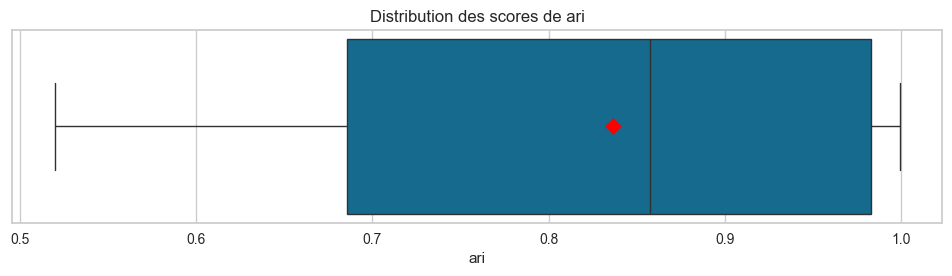

In [69]:
# Appel de la fonction
stabilite_initiation(Data_clust[Features_to_keep],
                     clust, preprocessor, 100,
                     Data_clust['cluster'],
                     adjusted_rand_score, 'ari',
                    "Boxplot_(KMeans_RFMADC+)")

La distribution des scores d’ARI obtenus après 100 exécutions indépendantes de la segmentation révèle une variabilité plus marquée, avec des valeurs comprises entre 0,4 et 1. Le score moyen d’ARI demeure supérieur à 0,8, ce qui témoigne d’une stabilité globalement satisfaisante du processus de segmentation, bien qu’inférieure à celle observée dans les segmentations précédemment mises en œuvre

## Représentation graphique

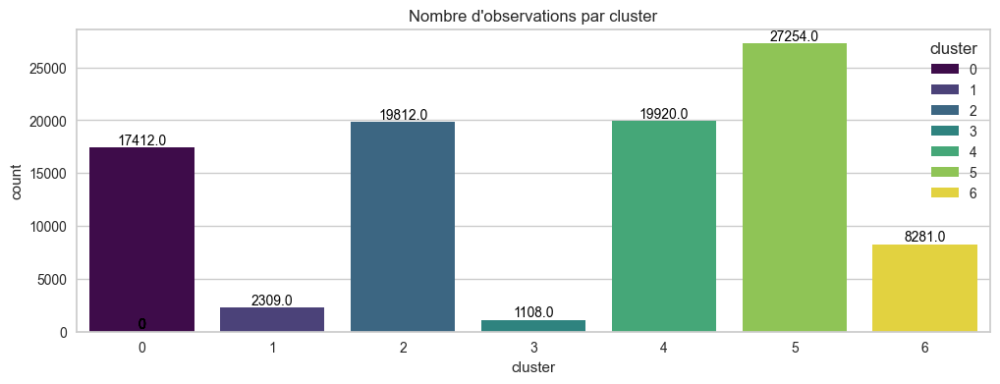

In [70]:
# Appel de la fonction
cluster_effectif(Data_clust, 'Effectif_(KMeans_RFMADC+)')

Lorsque toutes les variables quantitives sont utilisées, l'analyse de la taille des groupes montre que la segmentation a conduit à la formation de groupe de taille heterogène. On observe un groupe avec un grand nombre d'observation, et deux groupes avec très peu d'observation.

Il est mainteant important de caractériser précisément chacun de ces groupes afin de comprendre le profil moyen des clients qu'ils représentent. Cela sera fait grâce a des représentation graphique permettant de visualiser la distribution des variables utilisées lors de la segmentation en fonction des différents groupes identifiés.

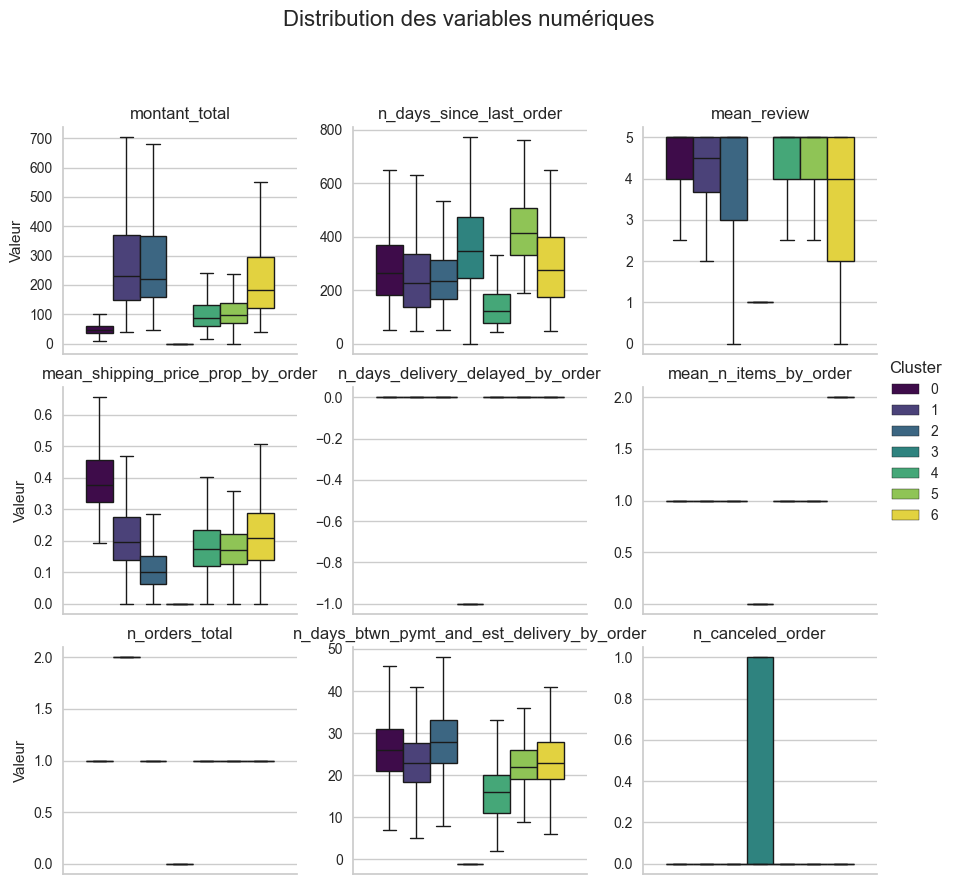

In [71]:
# Appel de la fonction
boxplot_by_cluster(Data_clust, 'Boxplot_(KMeans_RFMADC+)')

In [72]:
# Calcul de la moyenne de toutes les variables par cluster, sans filtre
mean_all = Data_clust.groupby('cluster').mean()

#  Calcul de la moyenne de mean review en excluant les 0
mean_var1_nozero = Data_clust[Data_clust['mean_review'] != 0].groupby('cluster')['mean_review'].mean()

# Remplacement de la colonne mean_review dans mean_all par cette nouvelle moyenne filtrée
mean_all['mean_review'] = mean_var1_nozero

# Affichage du résultat final
pd.DataFrame(mean_all)

,montant_total,n_days_since_last_order,mean_review,mean_shipping_price_prop_by_order,n_days_delivery_delayed_by_order,mean_n_items_by_order,n_orders_total,n_days_btwn_pymt_and_est_delivery_by_order,n_canceled_order
cluster,,,,,,,,,
0,53.924847,288.164427,4.066223,0.397609,0.921778,1.025155,1.000000,26.600735,0.000172
1,316.851698,249.702036,4.241691,0.214820,0.515164,1.218562,2.113036,23.448283,0.001732
2,337.808080,253.349939,3.997683,0.112350,1.443570,1.000858,1.000000,28.765698,0.000353
3,0.000000,356.220217,1.585887,0.000000,-1.000000,0.000000,0.000000,-1.000000,0.485560
4,106.051666,134.732681,4.303572,0.180821,0.405924,1.012249,1.000000,15.604167,0.000402
5,111.038540,422.878660,4.241298,0.173121,0.348573,0.999927,1.000000,22.946356,0.000294
6,260.261857,293.922473,3.572554,0.222223,0.508634,2.445478,1.000000,24.007004,0.000362


In [73]:
# Définition de la liste de couleur
color_dict = {0: '#440154',
              1: '#482475',
              2: '#414487',
              3: '#31688e',
              4: '#26828e',
              5: '#6ece58',
              6: '#fde725  '}

# Appel de la fonction
plot_radars(Data_clust, 'cluster', color_dict, "Radar_RFMADC+")

l'analyse des différent boxplot met en évidence différents profils de clients selon leur groupe d'appartenance.

- **cluster 0** : Ce groupe représente des clients ayant passé une seule commande composée d'un seul produit sur la plateforme d'Olist. Parmis les clients qui ont passé au moins une commande sur la plateforme, ce sont ceux qui ont le moins dépensé. Le temps écoulé depuis leur dernier achat est très variable Ces clients se déclarent plutôt très satisfaits avec une note moyenne avoisinant 4. Ils présentent le ratio le plus élevé de frais de port rapportés au montant total de leur commande. La majorité n’a pas connu de retard de livraison ni annulé de commande. Le délai entre le paiement et la date estimée de livraison est comparable à celui observé dans les autres groupes. Il s'agit probablement de clients ponctuels, inactifs depuis longtemps, qui n’ont pas été fidélisés.

- **cluster 1** : Ce groupe correspond aux clients les plus fidèles ayant passé en moyenne plus d'une commande. En conséquence ils figurent parmis les clients qui ont le plus dépensé d'argent sur la plateforme.  Ils font partie des clients les plus satisfaits et subissent peu de retards de livraison.. Le temps écoulé depuis leur dernier achat est variable mais en moyenne plus faible que ceux de la majorité des autres groupes. Certains clients de ce groupe a commandé plus d'un article par commande en moyenne. Les frais de livraison sont modérés, et les délais de livraison légèrement meilleurs que la moyenne. Ce sont des clients réguliers, engagés, mais aujourd’hui inactifs depuis plusieurs mois. 

- **cluster 2** : Ce groupe rassemble également des clients ayant passé une unique commande. Ils font partie des clients ayant le plus dépensé sur la plateforme d'Olist et ont passé leur commande relativement récemment par rapport aux autres groupes. Leur note de satisfaction est correcte, et ils ont très peu payé de frais de livraison. Cependant, le délai de livraison semble avoir été plus long que pour les autres groupes. Ce cluster regroupe des clients à fort potentiel qui, malgré une expérience relativement satisfaisante, ne sont pas encore revenus commander.

- **cluster 3** : Ce groupe correspond à des clients n’ayant pas concrétisé d’achat : soit leur commande a été annulée, soit elle a rencontré un problème logistique. En conséquence, ces clients n’ont généré aucun revenu sur la plateforme. Leur dernière tentative de commande est très variable mais remonte, en moyenne, à une date plus ancienne que celle des autres groupes. Ils affichent les scores de satisfaction les plus faibles, ce qui est cohérent avec des expériences d’achat annulées ou incomplètes.

- **cluster 4** : Ce groupe regroupe les clients dont l’achat est le plus récent. Leurs commandes contiennent en moyenne un seul produit et le montant dépensé est inférieur à celui des autres groupes. Ils font partie des clients les plus satisfaits et les moins impactés par les retards de livraison. Ils bénéficient également du délai le plus court entre le paiement et la livraison estimée. Le rapport frais de port / montant total est l’un des plus bas parmi les clients ayant réellement commandé. Ce cluster correspond à des nouveaux clients récents et contents, qui pourraient être fidélisés.

- **cluster 5** : Ce groupe rassemble des clients qui ont passé leur dernière commande depuis plus longtemps que ceux des autres clusters. Ils ont majoritairement commandé une seule fois sur la plateforme et leurs achats contiennent un seul produit en moyenne. Le montant dépensé par ces clients est plus faible que pour les autres groupes de clients à commande unique. Le ratio frais de port / montant total est interméidaire par rapport aux autres groupes. Malgré l’ancienneté, leur satisfaction reste très bonne. Ce sont des clients très anciens mais satisfaits, à relancer peut-être.

- **cluster 6**: Ce groupe regroupe des clients qui passé qu'une seule commande et qui ont en moyenne acheté plus de deux produits pour cette commande. En conséquence ce sont des clients qui ont beaucoup dépensé sur leur unique commande. Leur satisfaction est la plus faible de tous les clients actifs. L'expérience de livraison a été correcte, mais le niveau de satisfaction plus faible suggère un souci dans l’expérience. Ce sont des clients potentiellement déçus malgré une première commande prometteuse.

Cette segmentation permet d'identifier les clients dont les commandes contiennent en moyenne plus d’un produit. Elle permet également de distinguer des groupes  se différenciant par un taux de frais de port plus ou moins élevé. Elle met de plus en évidence des clients ayant des délais plus longs entre l’achat et la livraison. En revanche, cette segmentation apparait  plus diffilement interprétable et ne permet plus de repérer certains comportements pourtant plus intéressant d'un point de vue marketing. Par exemple, elle ne distingue pas les clients ayant subi des retards de livraison importants. Bien qu’enrichie, cette nouvelle segmentation ne fait donc pas ressortir certaines caractéristiques pourtant pertinentes pour une approche marketing ciblée.

# Cinquième segmentation: KMédoïd on RFMADC (+ cat var)

Jusqu'à présent seules les variables quantitatives ont été utilisée dans les différentes segmentations mises en place avec l'algorithme du K-means. En effet, cet algorithme repose sur le calcul de distance euclidienne qui ne sont pas adaptées lorsque le jeu de donnés contient des variables catégorielles.  Pour pouvoir effectuer une segmentation sur un jeu de données contenant à la fois des variables numériques et catégorielles, il est nécessaire d'utiliser des algorithmes compatibles avec d'autres types de distances. Deux alternatives pertinentes sont l'algorithme K-prototypes et le K-medoids, qui sera exploré dans la section suivante. Dans ce contexte, une distance plus adaptée aux données mixtes est la distance de Gower. Celle ci permet de combiner, des distances euclidiennes pour les variables numériques, et des distances de type "matching" pour les variables catégorielles.

L'algorithme des K-medoides est une méthode de clustering similaire au K-means mais qui se distingue par le fait qu'il utilise un médoïde (c'ést à dire un point réelle du jeu de données) à la place d'un centroide pour la formation des cluster. Ainsi cet algorithme peut fonctionner avec n’importe quelle matrice de dissimilarité, ce qui en fait une méthode particulièrement bien adaptée pour des données mixtes. Cet algorithme suit un processus en plusieurs étape. Lors de la phase d'initialisation, k observations sont choisies aléatoirement comme médoïdes initiaux. Puis chaque observation est assignée au médoïde le plus proche selon la matrice de dissimilarité. Pour chaque cluster, l'algorithme recherche ensuite un nouveau médoïde, c'est à dire un point du cluster, qui minimise la somme des distances intra cluster. Les deux dernières étapes sont répétées jusqu'à convergence c'est à dire lorsque les  médoïdes ne change plus ou qu'un nombre maximal d'itération est atteint.

Dans le cas de données mixtes, l’utilisation du K-medoids combiné à une métrique pré-calculée comme la distance de Gower permet de construire des clusters tout en respectant la nature des variables. Dans ce cas les distance entre chaque observations sont calculés préalablement et sont stockées dans une matrice de dissimilarité. La construction de cette matrice pouvant s'avérer coûteuse en termes de temps de calcul et de mémoire, notamment pour des jeux de données volumineux, cette approche sera testée sur un échantillon du jeu de données total pour en évaluer la pertinence

## Prétraitement des données

In [74]:
# Définition des variables à utiliser
Features_to_keep = ['montant_total', 'n_days_since_last_order', 'n_orders_total', 'mean_review',
                    'n_days_delivery_delayed_by_order', 'n_canceled_order',
                    'favorite_order_weekday', 'favorite_order_month']

# Variables à normaliser avec une normalisation PowerTransform
power_vars = ['n_days_since_last_order', 'n_orders_total',
              'montant_total', 'n_days_delivery_delayed_by_order']

# Variables à normaliser avec une normalisation MinMax
minmax_vars = ['mean_review']

# Selection des variables à utiliser
Data_clust = Data[Features_to_keep]
Data_clust = Data_clust.sample(40000, random_state=rdm_stt)

# Copie de la table
Data_clust_norm = Data_clust.copy()

# Normalisation
Data_clust_norm[power_vars] = PowerTransformer().fit_transform(Data_clust_norm[power_vars])
Data_clust_norm[minmax_vars] = MinMaxScaler().fit_transform(Data_clust_norm[minmax_vars])

# Calcul de la matrice de distance de Gower
gower_dist = gower.gower_matrix(Data_clust_norm)


##  détermination du nombre de cluster

Lorsque la segmentation est réalisée à l'aide d’un algorithme K-Médoïds appliqué sur une matrice de dissimilarité de Gower, le score de silhouette peut s’avérer moins pertinent.
En effet, l'utilisation de ce score suppose notamment que les distances entre les points sont euclidiennes. Or, la distance de Gower, conçue pour des données mixtes combine à la fois des distance euclidienne avec d'autres type de distances. Dans ce cas, le score de silhouette peut mal refléter la qualité de la séparation entre groupes. Il est donc important de l'interpréter en parrallèle à d'autres score plus adaptés. 
Des indices comme le score de Dunn, qui évalue le ratio entre la distance minimale inter cluster et la distance maximale intra cluster, offrent une alternative robuste, car ils reposent uniquement sur des relations de dissimilarité entre groupes d’individus et peuvent donc être plus fiables et interprétables lorsqu’on travaille avec une matrice de distances non euclidienne comme celle de Gower.

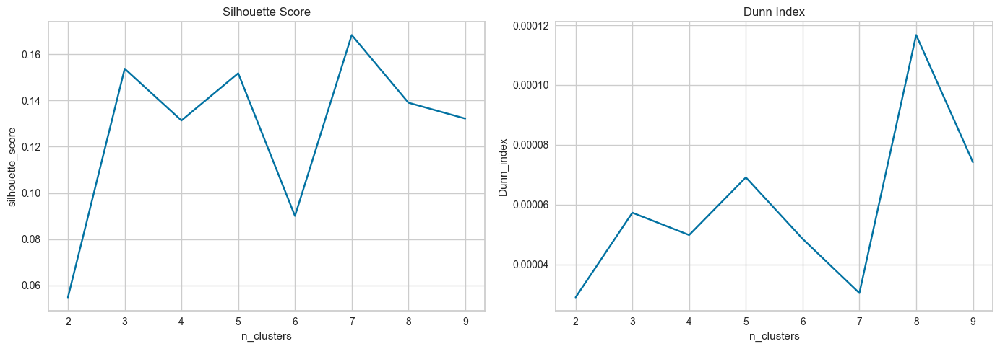

In [75]:
# Initialisation de la liste de résultat
resultats = []

# Pour chaque valeur de k
for k in range(2, 10):

    # Définition du modèle de segmentation
    clust = KMedoids(n_clusters=k, metric='precomputed', random_state=42)

    # Préduction des clusters
    labels = clust.fit_predict(gower_dist)

    # Calcul du score de silhouette
    score_silhouette = silhouette_score(gower_dist, labels, metric='precomputed')

    # Calcul de l'indice de Dunn
    cluster_unique = np.unique(labels)
    n_clusters = len(cluster_unique)

    # Calcul des distance maximum intra-cluster
    intra_clust_dist = []
    for cluster in cluster_unique:
        indices = np.where(labels == cluster)[0]
        if len(indices) <= 1:
            intra_clust_dist.append(0)
            continue
        intra_distances = gower_dist[np.ix_(indices, indices)]
        intra_clust_dist.append(np.max(intra_distances))

    # Calcul des distances minimum inter-cluster
    inter_clust_dist = []
    for i in range(n_clusters):
        for j in range(i+1, n_clusters):
            idx_i = np.where(labels == cluster_unique[i])[0]
            idx_j = np.where(labels == cluster_unique[j])[0]
            inter_clust_dist_val = gower_dist[np.ix_(idx_i, idx_j)]
            inter_clust_dist.append(np.min(inter_clust_dist_val))

    # Combinaison des deux
    if len(inter_clust_dist) == 0 or max(intra_clust_dist) == 0:
        score_dunn = 0
    else:
        score_dunn = min(inter_clust_dist) / max(intra_clust_dist)

    # Construction d'une ligne avec tous les résultats
    row = {
        'n_clusters': k,
        'silhouette_score': score_silhouette,
        'Dunn_index': score_dunn}

    # Ajout de la ligne dans la liste de résultats
    resultats.append(row)

# Conversion des résultats en dataframe
resultats_df = pd.DataFrame(resultats)

# Construction du graphique
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Silhouette score en fonction du nombre de cluster
sns.lineplot(data=resultats_df, x="n_clusters", y="silhouette_score", ax=axes[0])
axes[0].set_title("Silhouette Score")

# Dunn index en fonction du nombre de cluster
sns.lineplot(data=resultats_df, x="n_clusters", y="Dunn_index", ax=axes[1])
axes[1].set_title("Dunn Index")

# Ajustement des graphiques
plt.tight_layout()

# Sauvegarde des graphiques
plt.savefig(f'../Output/Performances/Graphique_silhouette_Dunn_KMedoid.png', format='png')

# Affichage du graphique
plt.show()

Lorsque les variables catégorielles sont intégrées à la segmentation à l’aide de l’algorithme des K-médoïdes, le score de silhouette atteint sa valeur maximale pour une segmentation en 7 clusters. Toutefois ce score est très faible. Il s'agit du moins bon score de silhouette obtenu jusqu'à mainteant et il est inférieur à 0.2. Ces faibles valeurs traduisent une faible séparation entre les groupes formés, ce qui suggère une structure de clusters peu marquée. Le score de Dunn atteint quant à lui son meilleur score pour 8 cluster mais il est inférieur à 0.1 ce qui est également très faible pour ce type de score. L'analyse ne sera pas poursuivie.

# Sixième segmentation: DBSCAN on RFMADC

Une autre approche est basée sur l'algorithme DBSCAN qui repose sur une analyse de la densité. Contrairement à Kmeans, il ne nécessite pas de spécifier le nombre de cluster à l'avance et peut identifier des clusters de formes arbitraire tout en detectant les outliers. DBSCAN parcourt les points un à un en examinant leurs voisins dans un rayon donné, afin de déterminer s’ils appartiennent à un cluster dense ou non. L'agorithme repose sur deux paramètre principaux.

- Epsilon correspondant au rayon autour d'un point pour rechercher des voisins
- min_sample correspondant au nombre minimum de points dans ce rayon pour considérer qu'on est dans une zone de densité suffisante c'est à dire dans un cluster.

Pour chaque point l'algorithme calcule le nombre de voisin de chaque point dans un rayon de epsilon. Le point est alors classifié. Si le point à un nombre minimum de point égal à min sample dans son voisinnage, ce point est considéré comme un point coeur. Si ce n'est pas un point coeur mais qu'il est dans le voisinange d'un point coeur, alors il est considéré comme un point de bordure. Sinon il est considéré comme un point correspondant à du bruit. On a ensuite une expansion du cluster sachant qu'un cluster commence avec un point coeur puis tous les points atteignable densément (autres point coeur ou bordure connectés à lui) sont ajouté au cluster.

Cette approche est peu adaptée au grand jeu de données car elle est caractérisée par une complexité algorithmique élevée. C'est pourquoi l'algorithme sera testé sur un sous-échantillon du jeu de donnée total. 

In [76]:
# Définition des variables à utiliser
Features_to_keep = ['montant_total', 'n_days_since_last_order', 'mean_review',
                    'n_orders_total', 'n_days_delivery_delayed_by_order', 'n_canceled_order']

# Variables à normaliser avec une normalisation PowerTransform
power_vars = [
    'n_days_since_last_order', 'n_orders_total',
    'montant_total', 'n_days_delivery_delayed_by_order']

# Variables à normaliser avec une normalisation MinMax
minmax_vars = ['mean_review']

# Variables binaire à ne pas normaliser
no_norm_var = ['n_canceled_order']

# Définition de la chaine de prétraitement à effectuer
preprocessor = ColumnTransformer(transformers=[
    ('power', PowerTransformer(), power_vars),
    ('minmax', MinMaxScaler(), minmax_vars),
    ('passthrough', 'passthrough', no_norm_var)
])

# Selection des variables à utiliser
Data_clust = Data[Features_to_keep]

# Echantillonnage aléatoire du jeu de donnée
Data_clust = Data_clust.sample(10000, random_state=rdm_stt)

##  détermination du nombre de cluster

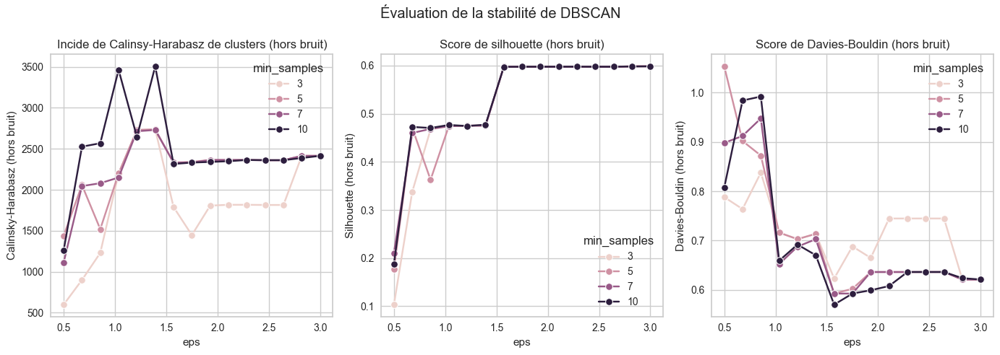

In [77]:
# Déinition des listes de paramètres à tester
eps_values = np.linspace(0.5, 3.0, 15)
min_samples_values = [3, 5, 7, 10]

# Prétraitement des données
Data_clust_norm = preprocessor.fit_transform(Data_clust)

# Initialisation d'une liste pour stocker les résultats
results = []

# Pour chaque paire de paramètres
for min_samples in min_samples_values:
    for eps in eps_values:

        # Initialisation du modèle
        model = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)

        # Prediction des étiquettes des cluster
        labels = model.fit_predict(Data_clust_norm)

        # Extraction des clusters hors bruit
        core_labels = labels[labels != -1]

        # Si le nombre de core cluster est strictement inférieur à 2 pas de score
        if len(np.unique(core_labels)) < 2:
            silhouette = np.nan
            ch_indice = np.nan
            db_indice = np.nanargmin

        else:
            silhouette = silhouette_score(Data_clust_norm[labels != -1], core_labels)
            ch_indice = calinski_harabasz_score(Data_clust_norm[labels != -1], core_labels)
            db_indice = davies_bouldin_score(Data_clust_norm[labels != -1], core_labels)


        # Ajout des résultats
        results.append({
            'eps': eps,
            'min_samples': min_samples,
            'n_clusters': len(set(labels)) - (1 if -1 in labels else 0),
            'n_noise': np.sum(labels == -1),
            'silhouette': silhouette,
            'Calinsky-Harabasz': ch_indice,
            'Davies-Bouldin': db_indice

        })

# Conversion de la liste de résultats en dataframe
df_results = pd.DataFrame(results)

# Construction des graphiques
fig, ax = plt.subplots(1, 3, figsize=(14, 5))

# Graphique représentant le nombre de cluster en fonction des valeurs de eps
sns.lineplot(data=df_results, x='eps', y='Calinsky-Harabasz', hue='min_samples', marker='o', ax=ax[0])
ax[0].set_title("Incide de Calinsy-Harabasz de clusters (hors bruit)")
ax[0].set_ylabel("Calinsky-Harabasz (hors bruit)")

# Graphique représentant le score de silhouette en fonction des valeurs de eps
sns.lineplot(data=df_results, x='eps', y='silhouette', hue='min_samples', marker='o', ax=ax[1])
ax[1].set_title("Score de silhouette (hors bruit)")
ax[1].set_ylabel("Silhouette (hors bruit)")

# Graphique représentant le score de silhouette en fonction des valeurs de eps
sns.lineplot(data=df_results, x='eps', y='Davies-Bouldin', hue='min_samples', marker='o', ax=ax[2])
ax[2].set_title("Score de Davies-Bouldin (hors bruit)")
ax[2].set_ylabel("Davies-Bouldin (hors bruit)")

# Ajout d'un titre global
plt.suptitle("Évaluation de la stabilité de DBSCAN")
plt.tight_layout()

# Sauvegarde de la figure
plt.savefig(f'../Output/Performances/Graphique_DaviesBouldin_silhouette_Calinski_DBSCAN.png', format='png')

plt.show()

Les meilleurs scores obtenus pour chacune des métriques d'évaluation ont été obtenus pour des valeurs de paramètres assez variables. Pour facilier le choix de la meilleure combinaison, on va classer chaque combinaison selon son rang individuel pour chacun de ces trois scores puis caculer un rang global combiné afin d’identifier les paramètres les plus performants sur l’ensemble des critères. Il sera aussi important de prendre en compte le nombre de clusters identifiés pour chacune des configurations ainsi que le nombre d'observations considérées comme du bruit par l'agorithme de DBSCAN.

In [78]:
# Calcul des rangs pour chacun des scores
df_results['Rang_db'] = df_results['Davies-Bouldin'].rank(method='dense').astype(int)
df_results['Rang_ch'] = df_results['Calinsky-Harabasz'].rank(method='dense', ascending=True).astype(int)
df_results['Rang_silhouette'] = df_results['silhouette'].rank(method='dense', ascending=True).astype(int)

# Cacul d'un rang global prenant en compte l'ensemble des scores
df_results['rang_all_score'] = df_results['Rang_db'] + df_results['Rang_ch'] + df_results['Rang_silhouette']

# Affichage des 10 meilleures configuration sur le score global
df_results.sort_values(by='rang_all_score').head(10)

,eps,min_samples,n_clusters,n_noise,silhouette,Calinsky-Harabasz,Davies-Bouldin,Rang_db,Rang_ch,Rang_silhouette,rang_all_score
0,0.500000,3,19,112,0.103331,598.750647,0.788200,27,1,1,29
1,0.678571,3,13,44,0.337804,899.747232,0.763882,26,2,5,33
45,0.500000,10,8,312,0.188246,1260.365760,0.807047,28,5,3,36
30,0.500000,7,10,210,0.210812,1111.909753,0.898043,31,3,4,38
2,0.857143,3,10,27,0.467372,1230.098716,0.837703,29,4,8,41
6,1.571429,3,5,6,0.597633,1789.647610,0.623072,8,9,25,42
33,1.035714,7,6,33,0.474104,2149.875664,0.652472,13,16,13,42
51,1.571429,10,4,13,0.597455,2315.219961,0.570031,1,19,22,42
17,0.857143,5,8,44,0.362875,1520.100017,0.872396,30,8,6,44
15,0.500000,5,8,171,0.176707,1438.558501,1.053401,37,6,2,45


Les 5 configurations présentant le meilleur rang global conduisent à un nombre de cluster élevé supérieur à 7 qui seront difficilement interprétable par l'équipe marketing. De plus, ces configurations aboutissent également à un nombre d'observations important de points classées comme bruit. La configuration suivante donne lieu a une segmentation en 5 clusters avec seulement 6 observations considérées comme du bruit. Elle présente le 8ième meilleur score de Davies-Boudin et le 9ième meilleur score de Calinski-Harabasz. Le score de silhouette est quant à lui classé en 25ième position mais reste bon. Afin de privilégier une configuration à la fois robuste, interprétable et bien structurée, c'est cette configuration qui sera retenu. Elle correpsond aux paramètre suivant : eps = 1.57 et min sample = 3

Score de silhouette moyen : 0.5970029037080266


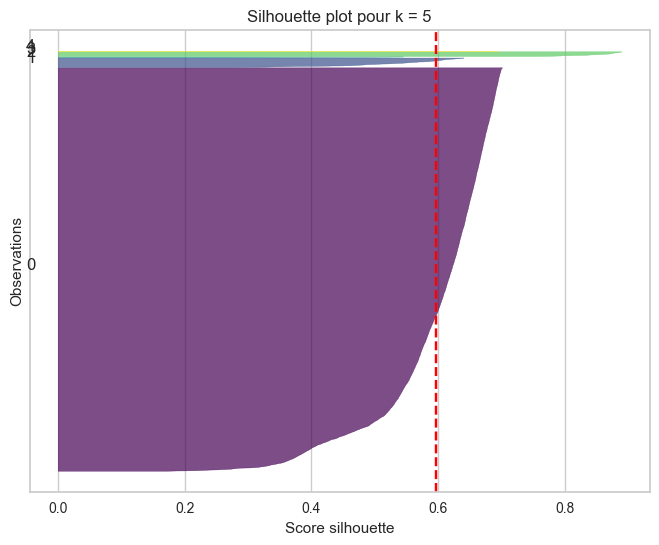

In [79]:
# Choix du nombre de cluster
nb_cluster = 5

# Définition du modèle
clust = DBSCAN(eps=1.571429, min_samples=3, n_jobs=-1)

# Appel de la fonction
graph_silhouette_score(Data_clust, preprocessor, clust, nb_cluster, 'Graph_Silouette_(DBSCAN_RFMADC)')

L'analyse approondie des scores de silhouette montrent que la majorité observations ont un score de silhouette supérieurs à 0.5 ce qui indique une cohésion interne satisfaisante et une bonne séparation entre les clusters. En revanche, seul 3 clusters sont visibles sur le graphique alors que la configuration utilisée est supposée aboutir à 5 clusters. De plus l'un des cluster apparait largement majoritaire par rapport au deux autres visibles apparaissant beaucoup plus restreint. Cela suggère un fort déséquilibre des effectifs entre les différents cluster. Cela pourra être confirmé lors de l'analyse de l'effectif des clusters de la partie suivante.

In [80]:
# Définition du modèle à utiliser
clust = DBSCAN(eps=1.571429, min_samples=3, n_jobs=-1)

# Pipeline
pipeline_clust = Pipeline([
        ("preprocessor", preprocessor),
        ("clustering", clust)
    ])

# Ajout du label aux données
Data_clust.loc[:, 'cluster'] = pipeline_clust.fit_predict(Data_clust)


## Stabilité du modèle à l'initiation

L’algorithme DBSCAN est un algorithme stable à l'initialisation. Cette stabilité s’explique par le fait que DBSCAN ne dépend pas d’une initialisation aléatoire, contrairement à d’autres algorithmes de clustering comme KMeans. Il produit donc des résultats identiques à chaque exécution, à condition que les données d'entrée restent identifique et que les paramètres eps et min_samples soient constants. Cela peut être vérifier en utilisant la même démarche que précédemment.

In [81]:
# Définition du modèle à analyser
clust = DBSCAN(eps=3, min_samples=3, n_jobs=-1)

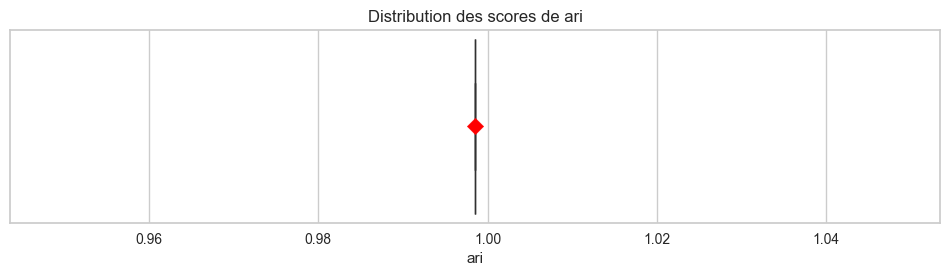

In [82]:
# Appel de la fonction
stabilite_initiation(Data_clust[Features_to_keep],
                     clust, preprocessor, 100,
                     Data_clust['cluster'],
                     adjusted_rand_score, 'ari',
                    "Boxplot_(DBSCAN_RFMADC)")

La distribution des scores d’ARI obtenus après 100 exécutions indépendantes de la segmentation avec l’algorithme DBSCAN montre que tous les scores sont égaux à 1. Ces scores indiquent que la segmentation est parfaitement stable et reproductible, avec une assignation identique des observations à chaque exécution.

## Représentation graphique

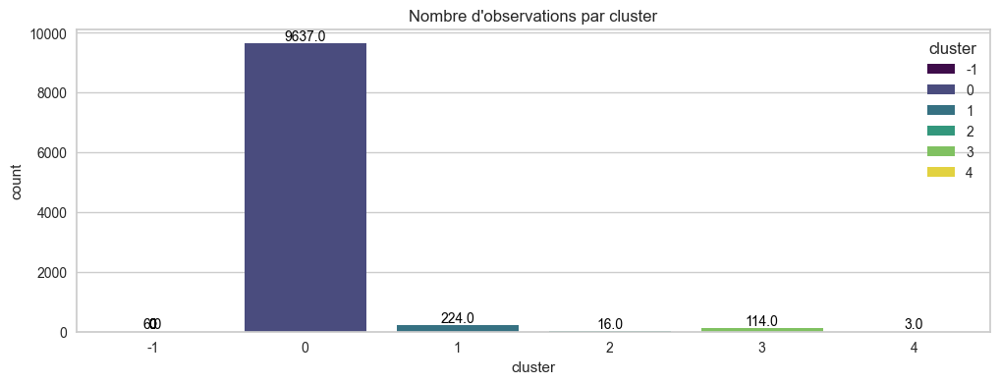

In [83]:
# Appel de la fonction
cluster_effectif(Data_clust, 'Effectif_(DBSCAN_RFMADC_1)')

L’analyse de la taille des groupes révèle que la segmentation obtenue avec l’algorithme DBSCAN conduit à la formation de groupes très hétérogènes en termes de taille. En particulier, un groupe majoritaire regroupe à lui seul environ 96 % des observations, tandis que les autres clusters sont très restreints. Dans le cadre d’une démarche de ciblage client pour la plateforme d’Olist, ce type de clustering s’avère donc peu pertinent, car il ne permet pas d’identifier des groupes d’utilisateurs distincts et actionnables.
On peut tester quelques unes des configurations suivantes dans le classement pour voir si on arrive à obtenir des groupes moins déséquilibrés.

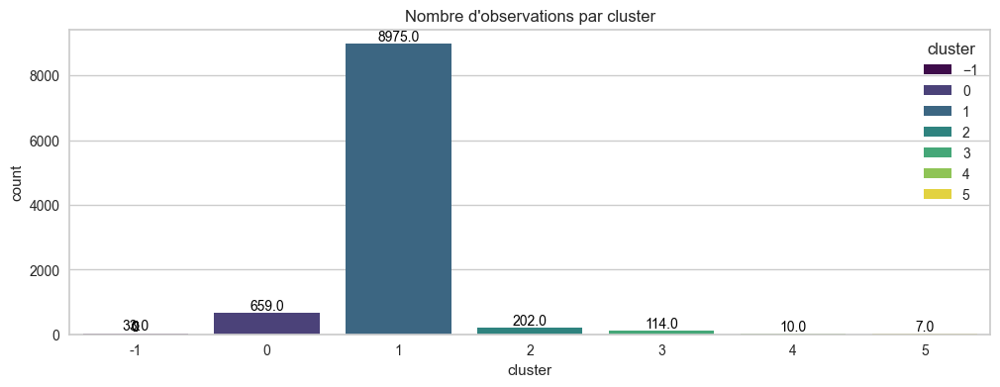

In [84]:
# Définition du modèle à utiliser
clust = DBSCAN(eps=1.035714, min_samples=7, n_jobs=-1)

# Pipeline
pipeline_clust = Pipeline([
        ("preprocessor", preprocessor),
        ("clustering", clust)
    ])

# Ajout du label aux données
Data_clust.loc[:, 'cluster'] = pipeline_clust.fit_predict(Data_clust)

# Appel de la fonction
cluster_effectif(Data_clust, 'Effectif_(DBSCAN_RFMADC_2)')

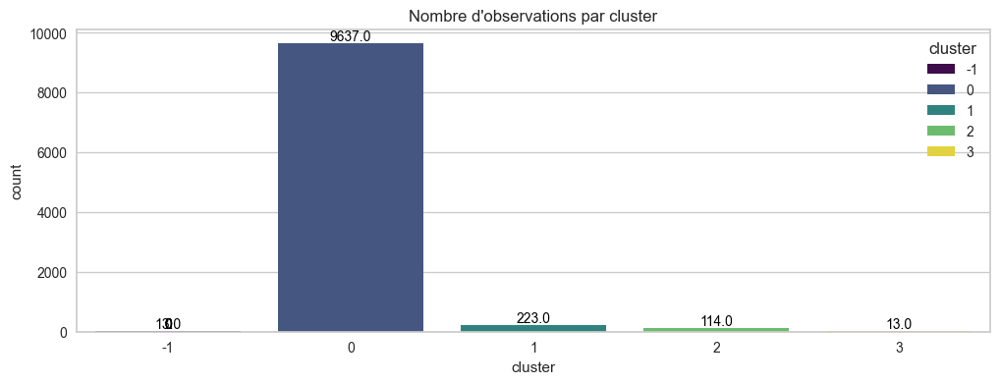

In [85]:
# Définition du modèle à utiliser
clust = DBSCAN(eps=1.571429, min_samples=10, n_jobs=-1)

# Pipeline
pipeline_clust = Pipeline([
        ("preprocessor", preprocessor),
        ("clustering", clust)
    ])

# Ajout du label aux données
Data_clust.loc[:, 'cluster'] = pipeline_clust.fit_predict(Data_clust)

# Appel de la fonction
cluster_effectif(Data_clust, 'Effectif_(DBSCAN_RFMADC_3)')

Les groupes obtenus en utilisant les configurations suivantes sont à nouveau fortement déséquilibrés. L'algorithme DBSCAN n'est peut être pas adapté au jeu de donnée utilisé dans ce projet. 

# Septième segmentation: AgglomerativeClustering on RFMADC

Une dernière approche de clustering sera explorée. Il s'agit de l'agglomerative clustering qui est une méthode de clustering hiérarchique qui suit une approche ascendante. Cet algorithme repose sur un processus itératif.

Lors de la première phase d'initialisation, chaque observation est considérée comme un cluster individuel. A chaque itération, les deux clusters les plus proches selon une mesure de distance préalablement déterminée sont fusionnés. Cette opération est répétée jusqu'a ce que tous les points soient regroupés en un seul cluster racine. Ce processus produit une arborescence qu'on appelle communément un dendogramme. A la fin de ce processus, on peut ensuite découper le dendrogramme à certain niveau pour obtenir un nombre de cluster souhaité. 

A l'instar de DBSCAN cette approche est moins adaptée pour les grand jeu de données car elle présente une complexité algorithmique élevée en raison du calcul et du stockage de la matrice de dissimilarité qui contient la distance entre toutes les paires d'observation du jeu de donnée. C'est pourquoi l'algorithme sera testé sur un sous-échantillon du jeu de donnée total. 

## Prétraitement des données

In [86]:
# Définition des variables à utiliser
Features_to_keep = ['montant_total', 'n_days_since_last_order', 'mean_review',
                    'n_orders_total', 'n_days_delivery_delayed_by_order', 'n_canceled_order']

# Variables à normaliser avec une normalisation PowerTransform
power_vars = [
    'n_days_since_last_order', 'n_orders_total',
    'montant_total', 'n_days_delivery_delayed_by_order']

# Variables à normaliser avec une normalisation MinMax
minmax_vars = ['mean_review']

# Variables binaire à ne pas normaliser
no_norm_var = ['n_canceled_order']

# Définition de la chaine de prétraitement à effectuer
preprocessor = ColumnTransformer(transformers=[
    ('power', PowerTransformer(), power_vars),
    ('minmax', MinMaxScaler(), minmax_vars),
    ('passthrough', 'passthrough', no_norm_var)
])

# Selection des variables à utiliser
Data_clust = Data[Features_to_keep]

# Selection d'un échantillon du jeu de donnée total
Data_clust = Data_clust.sample(20000, random_state=rdm_stt)

# Normalisation des données
Data_clust_norm = preprocessor.fit_transform(Data_clust)

##  détermination du nombre de cluster

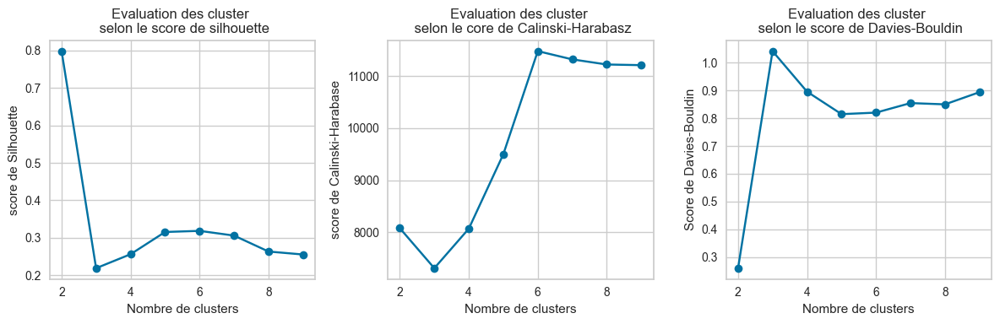

In [87]:
# Initialisation des listes stockant les score de silhouette et les score de Calinski-Harabasz
silhouette_scores = []
ch_scores = []
db_scores = []

# pour un nombre de cluster variant de 2 à 9
for k in range(2, 10):

    # Définition de la méthode de clustering
    clust = AgglomerativeClustering(n_clusters=k)

    # prédiction des étiquettes de chacun des groupes
    labels = clust.fit_predict(Data_clust_norm)

    # Calcul des scores de silhouette
    silhouette = silhouette_score(Data_clust_norm, labels)

    # Calcul des scores de Calinski-Harabasz
    ch = calinski_harabasz_score(Data_clust_norm, labels)

    # Calcul des scores de Davies-Bouldin
    db = davies_bouldin_score(Data_clust_norm, labels)

    # Ajout des scores dans la liste de résultats
    silhouette_scores.append(silhouette)
    ch_scores.append(ch)
    db_scores.append(db)

# Construction des graphiques
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

# Construction du graphique représentant les scores de silhouette en fonction du nombre de cluster
axs[0].plot(range(2, 10), silhouette_scores, marker='o')
axs[0].set_title("Evaluation des cluster \n selon le score de silhouette")
axs[0].set_xlabel("Nombre de clusters")
axs[0].set_ylabel("score de Silhouette")

# Construction du graphique représentant les scores de Calinski-Harabasz en fonction du nombre de cluster
axs[1].plot(range(2, 10), ch_scores, marker='o')
axs[1].set_title("Evaluation des cluster \n selon le core de Calinski-Harabasz")
axs[1].set_xlabel("Nombre de clusters")
axs[1].set_ylabel("score de Calinski-Harabase")

# Construction du graphique représentant les scores de Calinski-Harabasz en fonction du nombre de cluster
axs[2].plot(range(2, 10), db_scores, marker='o')
axs[2].set_title("Evaluation des cluster \n selon le score de Davies-Bouldin")
axs[2].set_xlabel("Nombre de clusters")
axs[2].set_ylabel("Score de Davies-Bouldin")

# Ajustement des graphiques
plt.tight_layout()

# Sauvegarde des graphiques
plt.savefig(f'../Output/Performances/Graphique_DaviesBouldin_silhouette_Calinski_AgglomerativeClustering.png', format='png')

# Affichage des graphiques
plt.show()

Ici, les graphiques représentant l’évolution des scores de qualité de la segmentation en fonction du nombre de clusters montrent que le meilleur score de silhouette ainsi que le score maximal de Calinski-Harabasz sont obtenus pour respectivement 2 et 6 clusters puis respectivement 6 et 7 clusters. Concernant le score de Davies-Bouldin, la valeur optimale est obtenue pour 2 puis 5 puis 6 clusters. Le nombre de clusters sera donc fixé à 6 pour les analyses suivantes. Comme mentioné précédemment, il est à noter que le score de silhouette obtenu n'est que modérément satisfaisant.

Score de silhouette moyen : 0.3186791239311416


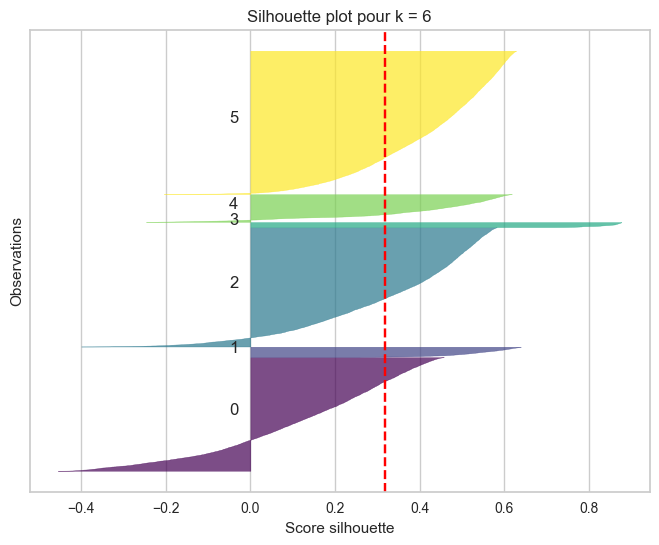

In [88]:
# Choix du nombre de cluster
nb_cluster = 6

# Définition du modèle
clust = lust = AgglomerativeClustering(n_clusters=nb_cluster)

# Appel de la fonction
graph_silhouette_score(Data_clust, preprocessor, clust, nb_cluster, 'Graph_Silouette_(HierarchicalClustering_RFMADC)')

La valeur moyenne du coefficient de silhouette obtenu pour cette segmentation se situe autour de 0.31. Ce score est modérément statisfaisant, ce qui signifie que le clustering est acceptable, mais pas optimal en termes de séparation entre les groupes et de cohésion interne. 

Les clusters 1, 3 et 4 sont très fins ce qui indique qu'ils contiennent peu d'observation. Toutefois, leur coefficient de silhouette plus élevé traduit une bonne cohésion interne.
Les clusters 0 et 5, plus larges, regroupent un nombre important d’observations, mais présentent des valeurs de silhouette globalement plus faibles, témoignant d’une cohésion interne plus faible ou d’une proximité avec d’autres clusters.
Les cluster 0, 2, 4 et 5 apparaissent plus problématiques, car ils contiennent plusieurs observations avec des coefficients de silhouette négatifs, ce qui suggère des observations ont pu être mal classées au sein de ces clusters.

Afin de poursuivre l’analyse en évaluant la stabilité face à l'initialisation de l'agorithme du KMeans et en caractérisant plus finement les groupes identifiés , les étiquettes de cluster seront ajoutées au jeu de données, afin de relier chaque observation à son groupe d’appartenance.

## Modélisation et extraction des labels

In [89]:
# Choix du nombre de cluster
nb_cluster = 6

# Copie de la dataframe
Data_clust = Data_clust.copy()

# Définition du modèle à utiliser
clust = AgglomerativeClustering(n_clusters=nb_cluster)

# Pipeline
pipeline_clust = Pipeline([
        ("preprocessor", preprocessor),
        ("clustering", clust)
    ])

# Ajout du label aux données
Data_clust.loc[:, 'cluster'] = pipeline_clust.fit_predict(Data_clust)

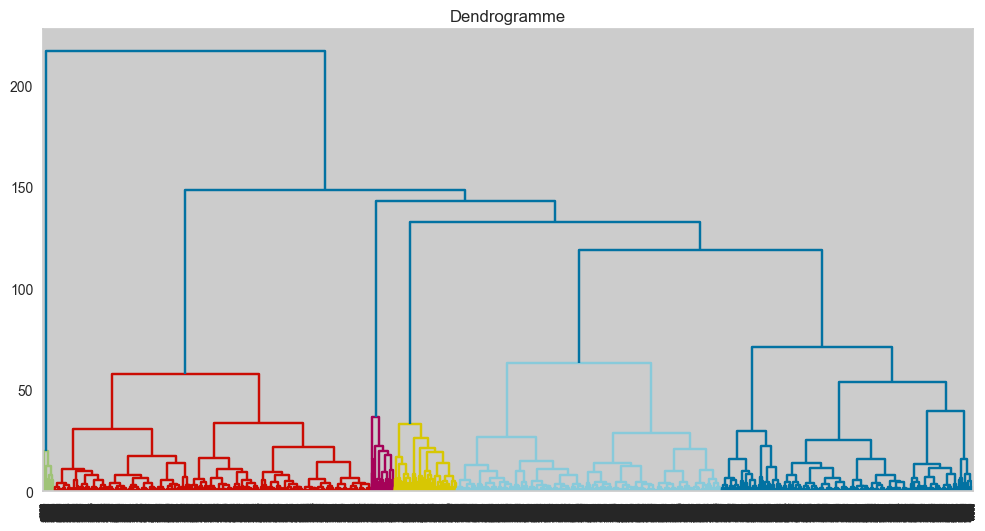

In [90]:
# Calcul des liaisons
Z = linkage(Data_clust_norm, method='ward')

#  Découpage des clusters
cluster_labels = fcluster(Z, t=nb_cluster, criterion='maxclust')
max_d = Z[-(nb_cluster-1), 2]

# Construction du dendrogramme
plt.figure(figsize=(12, 6))
dendrogram(Z,  color_threshold=max_d)
plt.title("Dendrogramme")

# Sauvegarde du dendogramme
plt.savefig(f'../Output/Dendrogramme/Dendogramme.png', format='png')

# Affichage du dendrogramme
plt.show()

## Stabilité du modèle à l'initiation

L’algorithme AgglomerativeClustering est également déterministe, c’est-à-dire qu’il produira exactement le même résultat à chaque exécution, tant que les données et les paramètres restent identiques. En effet, contrairement à d’autres méthodes de clustering comme le K-means il ne repose pas sur une phase d’initialisation aléatoire, ce qui garantit la reproductibilité des résultats.
On peut le vérifier en utilisant la même démarche que précédemment.

In [91]:
# Définition du modèle à analyser
clust = AgglomerativeClustering(n_clusters=nb_cluster)

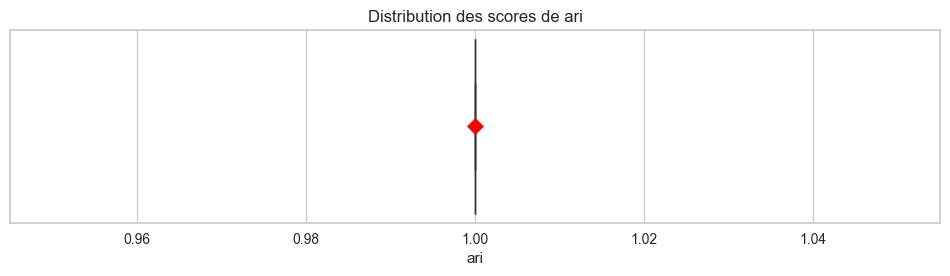

In [92]:
# Appel de la fonction
stabilite_initiation(Data_clust[Features_to_keep],
                     clust, preprocessor, 100,
                     Data_clust['cluster'],
                     adjusted_rand_score, 'ari',
                    "Boxplot_(HierarchicalClustering_RFMADC)")

La distribution des scores d’ARI obtenus après 100 exécutions indépendantes de la segmentation avec l’algorithme agglomerative clustering montre que tous les scores sont égaux à 1. Ces scores indiquent que la segmentation est parfaitement stable et reproductible, avec une assignation identique des observations à chaque exécution.

## Représentation graphique

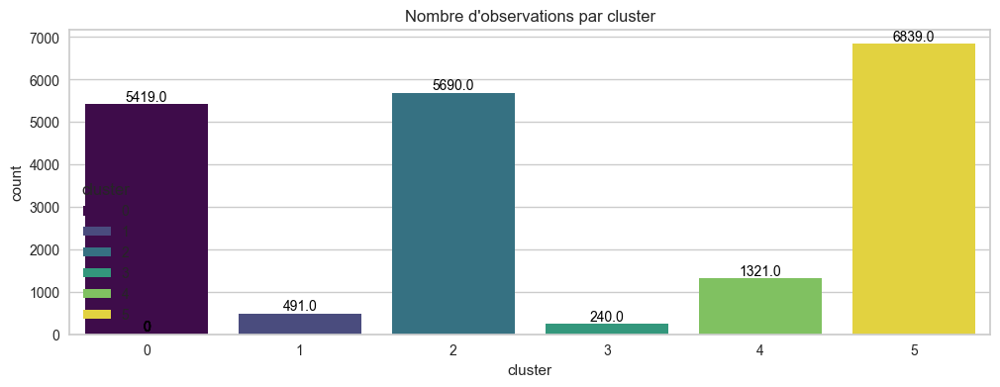

In [93]:
# Appel de la fonction
cluster_effectif(Data_clust, 'Effectif_(HierarchicalClustering_RFAMDC)')

L’analyse de la taille des groupes révèle que la segmentation obtenue avec l’algorithme AgglomerativeClustering conduit à la formation de groupes hétérogènes en termes de taille. En particulier, on observe 3 groupes de taille relativement importante et deux groupes nettement plus petit en terme d'effectif. 

Il est mainteant important de caractériser précisément chacun de ces groupes afin de comprendre le profil moyen des clients qu'ils représentent. Cela sera fait grâce a des représentation graphique permettant de visualiser la distribution des variables utilisées lors de la segmentation en fonction des différents groupes identifiés.

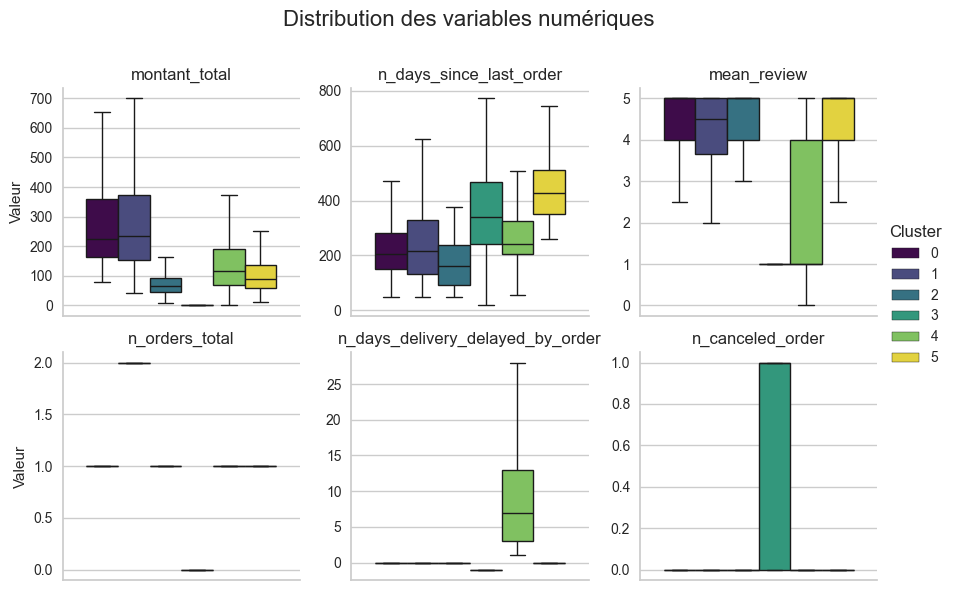

In [94]:
# Appel de la fonction
boxplot_by_cluster(Data_clust, 'Boxplot_(HierarchicalClustering_RFMADC)')

In [95]:
# Calcul de la moyenne de toutes les variables par cluster, sans filtre
mean_all = Data_clust.groupby('cluster').mean()

#  Calcul de la moyenne de mean review en excluant les 0
mean_var1_nozero = Data_clust[Data_clust['mean_review'] != 0].groupby('cluster')['mean_review'].mean()

# Remplacement de la colonne mean_review dans mean_all par cette nouvelle moyenne filtrée
mean_all['mean_review'] = mean_var1_nozero

# Affichage du résultat final
pd.DataFrame(mean_all)

,montant_total,n_days_since_last_order,mean_review,n_orders_total,n_days_delivery_delayed_by_order,n_canceled_order
cluster,,,,,,
0,328.994333,229.732792,4.214617,1.00000,0.001476,0.000000
1,305.475418,241.547862,4.222222,2.10998,0.728445,0.002037
2,71.482251,166.968893,4.246635,1.00000,0.000000,0.000351
3,0.000000,350.108333,1.493506,0.00000,-1.000000,0.516667
4,174.986056,269.999243,2.305901,1.00000,10.937169,0.000000
5,102.590469,436.109226,4.284759,1.00000,0.000000,0.000292


L’analyse des différents boxplots met en évidence plusieurs profils de clients selon leur groupe d’appartenance. 

- **cluster 0** : Ce cluster regroupe des clients ayant passé une seule commande récemment, pour un montant modéré. Leur satisfaction est très bonne, il n’y a eu aucun retard de livraison ni aucune annulation. Ce sont des clients récents et très satisfaits. Ils pourraient être réengagés facilement avec une stratégie de fidélisation.

- **cluster 1** : Ce groupe représente des clients qui ont passé plus de deux commandes en moyenne, pour un montant cumulé élevé. Ce sont ceux qui ont le plus dépensé sur la plateforme. Leur dernière est ancienne mais en moyenne plus récente que la plupart des autres groupes, et leur satisfaction est également très bonne. On note quelques retards de livraison modérés et un léger taux d’annulation. Il s'agit de clients réguliers et fidèles mais qui n'ont pas commendé depuis un certains temps.

- **cluster 2**: Ce groupe rassemble des clients ayant effectué une seule commande, il y a environ longtemps, pour un montant relativement élevé. Leur satisfaction est encore une fois très bonne, sans aucun retard, et un taux d’annulation quasi nul. Ce sont des clients au panier élevé et satisfaits, mais qui n’ont pas renouvelé leur achat.

- **cluster 3** : Ce groupe correspond à des clients n’ayant pas passé de commande effective, soit en raison d’annulations, soit parce que leur commande a rencontré des problèmes logistiques. En conséquence ces clients n'ont pas dépensé d'argent sur la plateforme d'Olist. Leur date de dernière tentative ou de création de commande est très variable, mais en moyenne plus ancienne que dans les autres groupes. Ces clients affichent une insatisfaction marquée.

- **cluster 4**: Ce groupe rassemble des clients ont passé une seule commande, intermédiaire par rapport aux autres groupes ayant passé une seule commande. Leur satisfaction est très faible, et ils ont subi des retards de livraison très importants. Ce sont des clients déçus, probablement à cause du retard de livraison relativement long. 

- **cluster 5**: Ce groupe rassemble des clients qui ont passé leur unique commande le plus anciennement et qui font partie des clients actifs qui ont le moins dépensé sur la plateforme. Leur niveau de satisfaction reste très bon. Ils n'ont rencontré aucun retard ni annulation. Bien qu’anciens, ce sont des clients à l’expérience positive. 

In [96]:
# Définition de la liste de couleur
color_dict = {0: '#440154',
              1: '#3e4989',
              2: '#26828e',
              3: '#1f9e89',
              4: '#6ece58',
              5: '#fde725'}

# Appel de la fonction
plot_radars(Data_clust, 'cluster', color_dict, "Radar_(HierarchicalClustering_RFMADC)")

# Choix de la segmentation et analyse SHAP

A l'exeption de la segmentation réalisée sur les données mixtes avec l'algorithme des KMédoïdes qui a donné des scores très faibles et celle réalisées avec DBSCAN qui a conduit à des groupes très déséquilibrés en terme d'effectifs, les autres segmentations ont aboutit à des scores de silhouettes modérés et dans le même ordre de grandeur variant entre 0.30 et 0.38. La taille des groupes bien qu'hétérogène restait néanmoins accetpable. Parmi ces segmentations, l'une est apparue plus pertinente d'un point de vue marketing. Il s'agit de la segmentation réalisée avec l'algorithme du KMeans appliqué aux variables RFM enrichies par les variables correspondant au niveau de satisfaction du client, au nom de commandes annulées et au retard des livraison. Le choix s'est ainsi porté sur cette approche. Par rapport aux autres segmentations misse en place, celle ci a permis d'identifier les causes de l'insastisfaction des clients de la plateforme d'Olist tout en conservant les autres caractéristiques propres à chacun des groupes.

Il pourrait être intéressant d’identifier les indicateurs ayant le plus contribué à la segmentation. Pour cela, on peut poursuivre en entraînant un modèle de classification, complété par une analyse SHAP afin d’interpréter l’importance des variables

In [97]:
# Définition des variables à utiliser
Features_to_keep = ['montant_total', 'n_days_since_last_order', 'mean_review', 'n_orders_total',
                    'n_days_delivery_delayed_by_order', 'n_canceled_order']

# Variables à normaliser avec une normalisation PowerTransform
power_vars = [
    'n_days_since_last_order', 'n_orders_total',
    'montant_total', 'n_days_delivery_delayed_by_order']

# Variables à normaliser avec une normalisation MinMax
minmax_vars = ['mean_review']

# Variables binaire à ne pas normaliser
no_norm_var = ['n_canceled_order']

# Définition de la chaine de prétraitement à effectuer
preprocessor = ColumnTransformer(transformers=[
    ('power', PowerTransformer(), power_vars),
    ('minmax', MinMaxScaler(), minmax_vars),
    ('passthrough', 'passthrough', no_norm_var)
])

# Selection des variables à utiliser
Data_clust = Data[Features_to_keep]

# Normalisation des données
Data_clust_nom = pd.DataFrame(preprocessor.fit_transform(Data_clust), columns=Data_clust.columns)

In [98]:
# Choix du nombre de cluster
nb_cluster = 6

# Copie de la dataframe
Data_clust = Data_clust.copy()

# Définition du modèle à utiliser
clust = KMeans(n_clusters=nb_cluster, random_state=rdm_stt)

# Pipeline
pipeline_clust = Pipeline([
        ("preprocessor", preprocessor),
        ("clustering", clust)
    ])

# Ajout du label aux données
Data_clust.loc[:, 'cluster'] = pipeline_clust.fit_predict(Data_clust)

# Echantillonnage des données
Data_clust = Data_clust.sample(50000, random_state=rdm_stt)

# Exctraction des données d'entrée et des clusters
X = pipeline_clust.named_steps['preprocessor'].transform(Data_clust)
y = Data_clust['cluster']

# Entraînement d'un modèle supervisé
rf = RandomForestClassifier(random_state=rdm_stt)
rf.fit(X, y)

# Initialisation de SHAP
explainer = shap.Explainer(rf, X)

# Calcul des valeurs SHAP
shap_values = explainer(X, check_additivity=False)

100%|===================| 299986/300000 [82:06<00:00]        

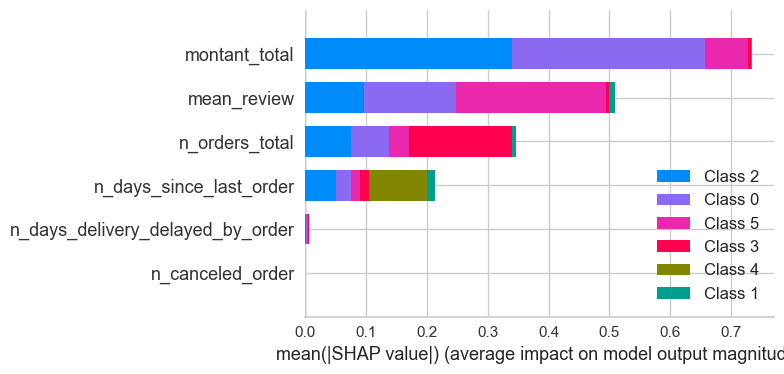

In [99]:
# Création du plot sans affichage
shap.summary_plot(
    shap_values[:50],
    features=X[:50],
    feature_names=Features_to_keep,
    show=False)

# Sauvegarde
plt.savefig("../Output/Explicativité/shap_summary.png",bbox_inches="tight",dpi=300)

# Affichage (optionnel)
plt.show()

# Nettoyage (bonne pratique)
plt.close()

Le graphique ci dessus illustre la contribution globale des différents indicateurs dans la prédiction des groupes issus de la segmentation. On observe que les variables ayant le plus contribué à la différenciation des clusters sont le montant total dépensé par les clients ainsi que leur niveau de satisfaction. Le nombre de commandes effectuées arrive en troisième position, malgré une faible variabilité entre les clients, ce qui suggère qu’il a néanmoins joué un rôle non négligeable dans la constitution des groupes.

Cependant, ces résultats, ainsi que ceux qui suivent, doivent être interprétés avec précaution car aucune évaluation  des performances du modèle de classification sous jacent n’a été réalisée ici. Une validation rigoureuse de la qualité prédictive du modèle est nécessaire pour s'assurer que les résultats de la classification reflètent bien ceux de la segmentation avant de tirer des conclusions définitives.

On peut aller plus loin en analysant de quelle manière les variables ont contribuer à l'affectation des points au sein des différents groupes.

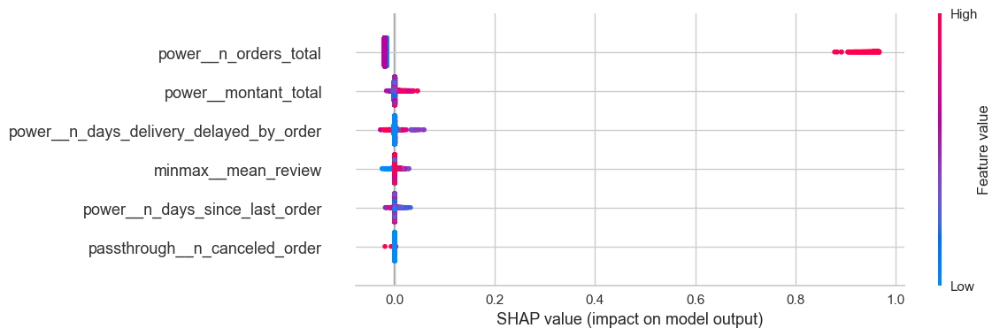

In [100]:
# Extraction des noms de variables après normalisation
feature_names = pipeline_clust.named_steps['preprocessor'].get_feature_names_out(Features_to_keep)

# Définition du cluster à analyser
cluster_id = 4

# Conversion des données normalisée en Dataframe
X_df = pd.DataFrame(X, columns=feature_names)

# Extraction des shap_values du cluster analysé
shap_vals_cluster = shap_values.values[:, :, cluster_id]

# Construction de l'objet Explanation
expl = shap.Explanation(
    values=shap_vals_cluster,
    data=X_df.to_numpy(),
    feature_names=X_df.columns.tolist()
)

# Construction du beeswarm plot
shap.plots.beeswarm(expl, plot_size=(10, 4), show=False)

# Sauvegarde
plt.savefig("../Output/Explicativité/beswarm_cluster4.png",bbox_inches="tight",dpi=300)

# Affichage (optionnel)
plt.show()

# Nettoyage (bonne pratique)
plt.close()

De façon attendue, on observe que plus la variable nombre de comande était élevée plus les clients ont été classé dans le cluster 4 correspondant aux clients les plus actifs.

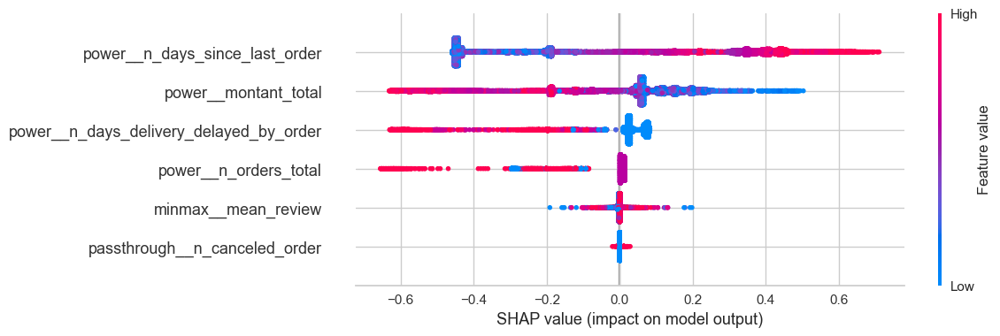

In [101]:
# Définition du cluster à analyser
cluster_id = 0

# Conversion des données normalisée en Dataframe
X_df = pd.DataFrame(X, columns=feature_names)

# Extraction des shap_values du cluster analysé
shap_vals_cluster = shap_values.values[:, :, cluster_id]

# Construction de l'objet Explanation
expl = shap.Explanation(
    values=shap_vals_cluster,
    data=X_df.to_numpy(),
    feature_names=X_df.columns.tolist()
)

# Construction du beeswarm plot
shap.plots.beeswarm(expl, plot_size=(10, 4), show=False)

# Sauvegarde
plt.savefig("../Output/Explicativité/beswarm_cluster0.png",bbox_inches="tight",dpi=300)

# Affichage (optionnel)
plt.show()

# Nettoyage (bonne pratique)
plt.close()

Le beeswarm plot du cluster 0, composé de clients peu dépensiers ayant effectué une commande récente unique, reflète bien les caractéristiques attendues de ce groupe. Le modèle a eu tendance à classer les clients dans ce cluster lorsque le nombre de jours écoulés depuis la dernière commande était élevé, que le montant total dépensé était faible, et que le nombre total de commandes était également relativement bas.

# Conclusions

Plusieurs approches de segmentation ont été explorées afin d’identifier des groupes de clients aux profils homogènes et actionnables. Une première approche utilisant l'algorithme du K-means a été appliqué sur différentes combinaison de variables, avec pour commencer les indicateurs traditionnels représentant le montant, la fréquence et la récence des commandes. Par la suite, d'autres indicateurs complémentaires ont été intégrés lors de la phase de segmentation pour enrichir l'analyse. L'intégration de variable qualitative a été testé avec l'algorithme de K-médoid. Les algorithmes DBSCAN et de l’algorithme de clustering hiérarchique agglomératif ont aussi été testés. D’autres segmentations ont également été explorées, notamment l’application de K-means sur un espace réduit obtenu par t-SNE à partir de l’ensemble des variables numériques, ainsi que l’utilisation de K-means sur d'autres combinaisons de variables. Par ailleurs, d'autres méthodes de normalisation ont été testées en parallèle. Cependant, ces différentes approches n’ont pas permis d’améliorer les résultats.

Pour déterminer les paramètres optimaux de chaque algorithme, plusieurs critères ont été utilisés : le score de silhouette, la distorsion, l'indice de Davies-Bouldin ainsi que l’indice de Calinski-Harabasz lorsque cela était possible. Ces différents scores ont ainsi été calculés pour différents nombres de clusters testés dans le cas du KMeans, du Kmédoid et de l'agglomerative clustering et pour différentes valeurs de eps et min sample pour DBSCAN. Par ailleurs, la stabilité des segmentations a été évaluée à travers plusieurs exécutions afin de s’assurer de la robustesse des groupes obtenus. Enfin, chaque segmentation a été analysée en profondeur pour en comprendre les caractéristiques et la pertinence d'un point de vue marketing.

Chacuune des segmentations réalisées dans ce notebook a été marquées par un score de silhouette plutôt moyen traduisant des groupes dont la séparation n'est pas très nette. Ces mauvais scores de silhouette pourraient s'expliquer par la distribution des variables utilisées dans les segmentation qui sont parfois fortement chevauchante entre certains groupes. 

Finalement, la segmentation retenue s'est basée sur l'utilisation du K-means apliqué aux variable RFM enrichi des variables correspondant à la note moyenne et au retard de livraison. Cette segmentation a permis de construire 6 groupes dont les profil sont résumé ci dessous.

- cluster 0 - **les clients occasionnels**: Clients anciens, peu dépensier affichant une bonne satisfaction
- Cluster 1 - **les clients frustrés**: clients dont la commande a été annulée soit de leur fait soit en raison d'un problème logistique, avec un fort mécontentement.
- Cluster 2 - **les nouveaux clients**:  Nouveaux acheteurs récents, peu dépensiers, affichant une bonne satisfaction.
- Cluster 3 - **les clients mécontents**: Clients insatisfaits suite à des retards de livraison.
- Cluster 4 - **les clients fidèles**: Clients fidèles et engagés avec une bonne satisfaction.
- Cluster 5 - **les clients prenium** : Clients réalisant des achats plus importants, globalement satisfaits.

Un plan d’action personnalisé pourra être mis en place grâce à cette segmentation afin d’adapter la stratégie marketing aux spécificités de chaque groupe, de manière à améliorer la satisfaction client, la fidélisation et la performance commerciale tout en prenant en compte les limites identifiées dans la segmentation actuelle. Il sera également nécessaire d'analyser la stabilité temporelle de cette segmentation afin de mettre en place un contrat de mainteance. Cela sera fait dans le prochain notebook.

Une autre limite identifiée au cours de la phase exploratoire concerne la fréquence d'achat des clients puisque moins de 3% d'entre eux ont effectué plus de deux commande sur la plateforme d'Olist. Cette distribution déséquilibrée réduit l’intérêt des indicateurs reflétant la fidélité ou à la fréquence d’achat dans la segmentation, et pourrait également expliquer en partie les performances modérées des algorithmes testés.